# install

1. 以下のサイトを見て、sumoをダウンロード
    https://sumo.dlr.de/docs/Installing/index.html#macos

    日本語, Macだとこの記事が参考になる
    https://zenn.dev/ha33aku/articles/f9ae08c92344e7

    Ubuntuだと、これ
    https://qiita.com/Mskmemory/items/1c63e3b1765ca523ae5a

1. Pythonパッケージのインストール
    PythonでSUMOを操作するために、パッケージをインストール。
    ```
    pip install traci requests folium osmnx
    ```

1. ネットワークの作成
    バウンディングボックス (周辺ゾーンも含む)を使用して、OpenStreetMapからネットワークを取り出す (network.ipynb, network.py)

1. 需要の作成
    * ランダムに生成する場合
        * random_demand.py
        * random_DUE.py (DUEで経路を選択する場合)
    * OD表から作成する場合 (od_demand.ipynb)
        1. 国勢調査から合成人口を作成 (pop_synthesis.ipynb)
            このとき、周辺ゾーンは需要の発生点として含まない
        1. TAZ (Traffic Assignment Zone)の作成 (taz_generate.py)
            OD表はOゾーンからDゾーンの指定しかできないので、ここでTAZとリンクの関係を記述
        1. 避難行動モデルの推定結果より、時間帯別OD表を作成 (od_matrix.ipynb)
        1. 道路交通センサスのOD表から、Background trafficを生成
        1. TAZ単位のODをエッジ単位に修正し (od2trips)、経路を作成 (duarouer)し、trips.trips.xmlとroutes.rou.xmlを作成 (od_demand.py)
        



# GUIでのシミュレーション可視化
✅ XQuartzを起動しておく

In [ ]:
setting_folder = "od_koto" # random / od_koto
setting = '1.0normal_1.0evac' # random_DUE_veh23439_end7200_period0.3
demand_scenario = '93'
network_dir = 'network/data'
demand_dir = f'demand/{setting_folder}/{setting}/{demand_scenario}'
parking_dir = 'evac_shelter'
output_dir = f'output'
period_average = 300 # MFDを計算するための間隔

In [ ]:
import os
import sys
import subprocess
from collections import defaultdict
import pandas as pd
import pandas_read_xml as pdx
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import lxml.etree as ET # lxmlを使用してXMLファイルを解析する
import traci
# If you decide to switch to libsumo:
#import libsumo as traci
import sumolib
import platform
import distro
import copy
import argparse
import shutil
from pathlib import Path


def detect_os():
    os_name = platform.system()
    if os_name == 'Linux':
        if 'Ubuntu' in distro.id():
            return "Ubuntu"
        else:
            return "Other Linux"
    elif os_name == 'Darwin':
        return "macOS"
    else:
        return "Other OS"

os_type = detect_os()

if os_type == "Ubuntu":
    # SUMOのホームディレクトリを設定
    sumo_home = os.environ.get('SUMO_HOME')
    if not sumo_home:
        raise EnvironmentError("Please set the 'SUMO_HOME' environment variable.")
else:
    # SUMOのホームディレクトリを設定
    sumo_home = os.environ.get('SUMO_HOME')
    if not sumo_home:
        raise EnvironmentError("Please set the 'SUMO_HOME' environment variable.")

# 出力ディレクトリを作成
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
if not os.path.exists(f"{output_dir}/{setting}"):
    os.makedirs(f"{output_dir}/{setting}")
else:
    os.system(f"rm -r {output_dir}/{setting}")
if not os.path.exists(f"{output_dir}/{setting}/edge"):
    os.makedirs(f"{output_dir}/{setting}/edge")
else:
    os.system(f"rm -r {output_dir}/{setting}/edge")
if not os.path.exists(f"{output_dir}/{setting}/mfd"):
    os.makedirs(f"{output_dir}/{setting}/mfd")
else:
    os.system(f"rm -r {output_dir}/{setting}/mfd")

# インプットファイルのパス
net_file = os.path.join(network_dir, 'output.net.xml')
trips_file = os.path.join(demand_dir, 'trips.trips.xml') # トリップファイルのパス
routes_file = os.path.join(demand_dir, 'routes.rou.xml') # ルートファイルのパス
parking_csv = os.path.join(demand_dir, 'shelter_list.csv') # 駐車場ファイルのパス
additional_file = 'additional.add.xml' # 車両タイプの定義, エッジデータの出力ファイル
edge_output_file = os.path.join(output_dir, setting, 'edge_data.xml')
zone_edge_file = os.path.join('../network_partitioning/zoning.csv') # ゾーンとエッジの対応表

def get_simulation_start_time(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    min_depart = 1e10
    for trip in root.findall('trip'):
        depart_time = float(trip.get('depart', 0))
        if depart_time < min_depart:
            min_depart = depart_time
    return int(min_depart)

# シミュレーションの終了時間を取得する関数
def get_simulation_end_time(xml_file, buffer_time=1800):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    max_depart = 0
    for trip in root.findall('trip'):
        depart_time = float(trip.get('depart', 0))
        if depart_time > max_depart:
            max_depart = depart_time
    # バッファ時間を追加
    return int(max_depart + buffer_time)  # バッファとして追加

# シミュレーションの終了時間を取得
simulation_start_time = get_simulation_start_time(trips_file)
simulation_end_time = get_simulation_end_time(trips_file)
print(f"Simulation time: {simulation_start_time} - {simulation_end_time}")

def getNeighboringEdges(edge_id, net, radius=0.1):
    neighboring_edges = net.getEdge(edge_id).getShape()
    x_0, y_0 = neighboring_edges[0][0], neighboring_edges[0][1]
    x_last, y_last = neighboring_edges[-1][0], neighboring_edges[-1][1]
    edges = net.getNeighboringEdges(x_0, y_0, r=radius) + net.getNeighboringEdges(x_last, y_last, r=radius)
    edge_ids = [edge.getID() for edge, _ in edges]
    return edge_ids
# net_fileのエッジを読み込み
tree = ET.parse(net_file)
root = tree.getroot()
xml_edges = []
# edgeタグを確認
for edge in root.findall('.//edge'):
    xml_edges.append(edge.get('id'))
# ゾーンとエッジのCSVを読み込む
zone_edges_df = pd.read_csv(zone_edge_file, header=0)

# ゾーンごとにエッジリストを作成
zone2edge = {}
for i, col in enumerate(zone_edges_df.columns):
    # xml_edgesに存在するエッジのみを抽出
    zone2edge[i] = zone_edges_df[col].apply(lambda x: x if x in xml_edges else np.nan).dropna().tolist()
# エッジとゾーンの対応
edge2zone = {}
for zone_id, edges in zone2edge.items():
    for edge_id in edges:
        edge2zone[edge_id] = zone_id

# additional.add.xml ファイルの内容を作成
df_park = pd.read_csv(parking_csv, encoding='utf-8', usecols=['name', 'address', 'lat', 'lon', 'capacity', 'edge_id'])
net = sumolib.net.readNet(net_file)
with open(additional_file, 'w') as f:
    f.write(f"""
<additional>
    <vType id="container" vClass="passenger" length="10.0" maxSpeed="20.0" color="1,0,0"/>
    <vType id="cable_car" vClass="passenger" length="15.0" maxSpeed="15.0" color="0,1,0"/>
    <vType id="subway" vClass="passenger" length="25.0" maxSpeed="30.0" color="0,0,1"/>
    <vType id="aircraft" vClass="passenger" length="50.0" maxSpeed="100.0" color="1,1,0"/>
    <vType id="wheelchair" vClass="passenger" length="1.0" maxSpeed="5.0" color="0,1,1"/>
    <vType id="scooter" vClass="passenger" length="2.0" maxSpeed="10.0" color="1,0,1"/>
    <vType id="drone" vClass="passenger" length="5.0" maxSpeed="50.0" color="0.5,0.5,0.5"/>
    <edgeData id="edgeData" file="{edge_output_file}" begin="0" end="{simulation_end_time}" freq="{period_average}"/>
""")

    parking_edge_ids = list()
    for index, row in df_park.iterrows():
        edge_id = row['edge_id']
        lane_id = edge_id + '_0'
        if edge_id not in parking_edge_ids:
            parking_edge_ids.append(edge_id)
            f.write(f"""
                    <parkingArea id="{edge_id}" name="{row['name']}" lane="{lane_id}" roadsideCapacity="{row['capacity']}" roadSide="right" angle="270" length="8"/>
                    """)
            
    for edge_id in parking_edge_ids:
        next_edges = getNeighboringEdges(edge_id, net, radius=20)
        next_next_edges = list()
        for next_id in next_edges:
            next_next_edges.extend(getNeighboringEdges(next_id, net, radius=20))
        connected_edges = list(set([edge_id] + next_edges + next_next_edges))
        f.write(f"""
            <rerouter id="Rerouter_{edge_id}" edges="{" ".join(connected_edges)}">
                <interval begin="{simulation_start_time}" end="{simulation_end_time}">
        """)
        for alt_edge_id in parking_edge_ids:
            if alt_edge_id != edge_id:
                f.write(f"""
                        <parkingAreaReroute id="{alt_edge_id}"/>
                """)
            else:
                f.write(f"""
                        <parkingAreaReroute id="{alt_edge_id}" visible="True"/>
                """)
        f.write(f"""
                </interval>
            </rerouter>
        """)
    f.write("""
</additional>
""")
print("Additional XML file created.")

# シミュレーションの設定ファイル（.sumocfg）の作成
sumo_config_file = f"{setting}.sumocfg"
with open(sumo_config_file, 'w') as f:
    f.write(f"""
    <configuration>
        <input>
            <net-file value="{net_file}"/>
            <route-files value="{routes_file}"/>
            <additional-files value="{additional_file}"/>
        </input>
        <time>
            <begin value="{simulation_start_time}"/>
            <end value="{simulation_end_time}"/>
            <step-length value="1.0"/>  <!-- ステップ長は1.0秒 -->
        </time>
        <processing>
            <time-to-teleport value="600"/> <!-- テレポートを禁止。正の値を設定すると、その時間経過後にテレポートする -->
        </processing>
    </configuration>
    """)

# SUMOシミュレーションを実行するためのコマンド
sumo_cmd = [
    os.path.join(sumo_home, 'bin', 'sumo-gui'),
    '-c', sumo_config_file
]

# コマンドを実行
subprocess.run(sumo_cmd, check=True)
print("SUMO simulation started")


Simulation end time: 173278.8
Additional XML file created.


pj_obj_create: /Users/masudasatoki/opt/anaconda3/share/proj/proj.db lacks DATABASE.LAYOUT.VERSION.MAJOR / DATABASE.LAYOUT.VERSION.MINOR metadata. It comes from another PROJ installation.
pj_obj_create: /Users/masudasatoki/opt/anaconda3/share/proj/proj.db lacks DATABASE.LAYOUT.VERSION.MAJOR / DATABASE.LAYOUT.VERSION.MINOR metadata. It comes from another PROJ installation.
pj_obj_create: /Users/masudasatoki/opt/anaconda3/share/proj/proj.db lacks DATABASE.LAYOUT.VERSION.MAJOR / DATABASE.LAYOUT.VERSION.MINOR metadata. It comes from another PROJ installation.


SUMO simulation started


# Pythonから実行結果を取得

In [1]:
# 設定
setting_folder = "od_koto" # random / od_koto
setting = 'output' 
network_dir = 'network/data'
demand_dir = f'demand/{setting_folder}/{setting}'
parking_dir = 'evac_shelter'
output_dir = f'output'
period_average = 90 # MFDを計算するための間隔

In [6]:
import os
import sys
import subprocess
import pandas as pd
import pandas_read_xml as pdx
import numpy as np
import matplotlib.pyplot as plt
from collections import Counter
import lxml.etree as ET # lxmlを使用してXMLファイルを解析する
import traci
# If you decide to switch to libsumo:
# import libsumo as traci
import sumolib
import platform
import distro

# os.chdir(os.path.dirname(os.path.abspath(__file__)))

def detect_os():
    os_name = platform.system()
    if os_name == 'Linux':
        if 'Ubuntu' in distro.id():
            return "Ubuntu"
        else:
            return "Other Linux"
    elif os_name == 'Darwin':
        return "macOS"
    else:
        return "Other OS"

os_type = detect_os()

if os_type == "Ubuntu":
    # SUMOのホームディレクトリを設定
    sumo_home = os.environ.get('SUMO_HOME')
    if not sumo_home:
        raise EnvironmentError("Please set the 'SUMO_HOME' environment variable.")
else:
    # SUMOのホームディレクトリを設定
    sumo_home = os.environ.get('SUMO_HOME')
    if not sumo_home:
        raise EnvironmentError("Please set the 'SUMO_HOME' environment variable.")

# 出力ディレクトリを作成
if not os.path.exists(output_dir):
    os.makedirs(output_dir)
if not os.path.exists(f"{output_dir}/{setting}"):
    os.makedirs(f"{output_dir}/{setting}")
else:
    os.system(f"rm -r {output_dir}/{setting}")
if not os.path.exists(f"{output_dir}/{setting}/edge"):
    os.makedirs(f"{output_dir}/{setting}/edge")
else:
    os.system(f"rm -r {output_dir}/{setting}/edge")
if not os.path.exists(f"{output_dir}/{setting}/mfd"):
    os.makedirs(f"{output_dir}/{setting}/mfd")
else:
    os.system(f"rm -r {output_dir}/{setting}/mfd")

# インプットファイルのパス
net_file = os.path.join(network_dir, 'output.net.xml')
trips_file = os.path.join(demand_dir, 'trips.trips.xml') # トリップファイルのパス
routes_file = os.path.join(demand_dir, 'routes.rou.xml') # ルートファイルのパス
parking_csv = os.path.join(parking_dir, 'evac_flood_koto_depth.csv') # 駐車場ファイルのパス
additional_file = 'additional.add.xml' # 車両タイプの定義, エッジデータの出力ファイル
edge_output_file = os.path.join(output_dir, setting, 'edge_data.xml')

# シミュレーションの終了時間を取得する関数
def get_simulation_end_time(xml_file):
    tree = ET.parse(xml_file)
    root = tree.getroot()
    max_depart = 0
    for trip in root.findall('trip'):
        depart_time = float(trip.get('depart', 0))
        if depart_time > max_depart:
            max_depart = depart_time
    # バッファ時間を追加
    return max_depart + 600  # 600秒（10分）をバッファとして追加

# シミュレーションの終了時間を取得
simulation_end_time = get_simulation_end_time(trips_file)
print(f"Simulation end time: {simulation_end_time}")

# additional.add.xml ファイルの内容を作成
df_park = pd.read_csv(parking_csv, encoding='utf-8', usecols=['name', 'lat', 'lon', 'capacity'])
net = sumolib.net.readNet(net_file)
with open(additional_file, 'w') as f:
    f.write(f"""
<additional>
    <vType id="container" vClass="passenger" length="10.0" maxSpeed="20.0" color="1,0,0"/>
    <vType id="cable_car" vClass="passenger" length="15.0" maxSpeed="15.0" color="0,1,0"/>
    <vType id="subway" vClass="passenger" length="25.0" maxSpeed="30.0" color="0,0,1"/>
    <vType id="aircraft" vClass="passenger" length="50.0" maxSpeed="100.0" color="1,1,0"/>
    <vType id="wheelchair" vClass="passenger" length="1.0" maxSpeed="5.0" color="0,1,1"/>
    <vType id="scooter" vClass="passenger" length="2.0" maxSpeed="10.0" color="1,0,1"/>
    <vType id="drone" vClass="passenger" length="5.0" maxSpeed="50.0" color="0.5,0.5,0.5"/>
    <edgeData id="edgeData" file="{edge_output_file}" begin="0" end="{simulation_end_time}" freq="{period_average}"/>
""")

    for index, row in df_park.iterrows():
        x, y = net.convertLonLat2XY(row['lon'], row['lat'])
        f.write(f"""
    <parkingArea id="{row['name']}" x="{x}" y="{y}" capacity="{row['capacity']}"/>
""")
    f.write("</additional>")
print("Additional XML file created.")

# シミュレーションの設定ファイル（.sumocfg）の作成
sumo_config_file = f"{setting}.sumocfg"
with open(sumo_config_file, 'w') as f:
    f.write(f"""
    <configuration>
        <input>
            <net-file value="{net_file}"/>
            <route-files value="{routes_file}"/>
            <additional-files value="{additional_file}"/>
        </input>
        <time>
            <begin value="0"/>
            <end value="{simulation_end_time}"/>
            <step-length value="1.0"/>  <!-- ステップ長は1.0秒 -->
        </time>
        <processing>
            <time-to-teleport value="-1"/> <!-- テレポートを禁止。正の値を設定すると、その時間経過後にテレポートする -->
        </processing>
    </configuration>
    """)

# SUMOシミュレーションを実行するためのコマンド
sumo_cmd = [
    os.path.join(sumo_home, 'bin', 'sumo'),
    '-c', sumo_config_file,
    '--start',  # シミュレーションを自動的に開始するオプション
    #'--log', 'log.txt',
    #'--message-log', 'log.xml',
    #--error-log', 'log.err'
]

# SUMOシミュレーションを実行
subprocess.run(sumo_cmd, check=True)


Simulation end time: 90
Parking areas XML file created.


## エッジデータを解析してMFDを描画

In [7]:
# XMLファイルを解析
df = pdx.read_xml(edge_output_file, ['meandata'])
df = pdx.flatten(df)
df = df.pipe(pdx.flatten)
df = df.pipe(pdx.flatten)
df = df.pipe(pdx.flatten)
df = df.rename({'interval|@begin': 'begin', 'interval|@end': 'end',
                'interval|edge|@id': 'edge_id',
                'interval|edge|@sampledSeconds': 'sampledSeconds', 'interval|edge|@density': 'density',
                'interval|edge|@laneDensity': 'laneDensity', 'interval|edge|@speed': 'speed'}, axis=1)
df = df.iloc[:,2:]

df['begin'] = df['begin'].astype(float)
df['end'] = df['end'].astype(float)
df["sampledSeconds"] = df["sampledSeconds"].astype(float)
df["density"] = df["density"].astype(float)
df["laneDensity"] = df["laneDensity"].astype(float)
df["speed"] = df["speed"].astype(float)
df = df.replace(np.NaN, 0)
df['begin'] = df['begin'].astype(int)

# calculation time interval
bft = df.begin.iloc[0]
eft = df.end.iloc[0]
time_interval = eft - bft
time_interval = int(time_interval)

# The end time of the last interval
_lastsimulationperiod_ = (df.end.iat[-1]).astype(int)
# creating a list of all end time intervals
_beginvalues_ = list(range(0, _lastsimulationperiod_ + 1, time_interval))

# detecting number of segments
counter1 = Counter(df.begin)
_seg = counter1[0]
counter1

# calculating total length of network
# 密度0のリンクはMFDの計算に含めないので、リンク長を0とする
length = df['sampledSeconds'] / (df['end']-df['begin']) / df['density'] # km
df['Length'] = length.replace(np.NaN, 0).replace(np.inf, 0) # km
i = 0
j = 0
__net = []
while _beginvalues_[i] < (_lastsimulationperiod_):
    _net = sum(df.Length.iloc[j:j+_seg]) # km
    __net.append(_net)
    i = i+1
    j = j+_seg

<img src="etc/Edie_definition.png" width="60%">

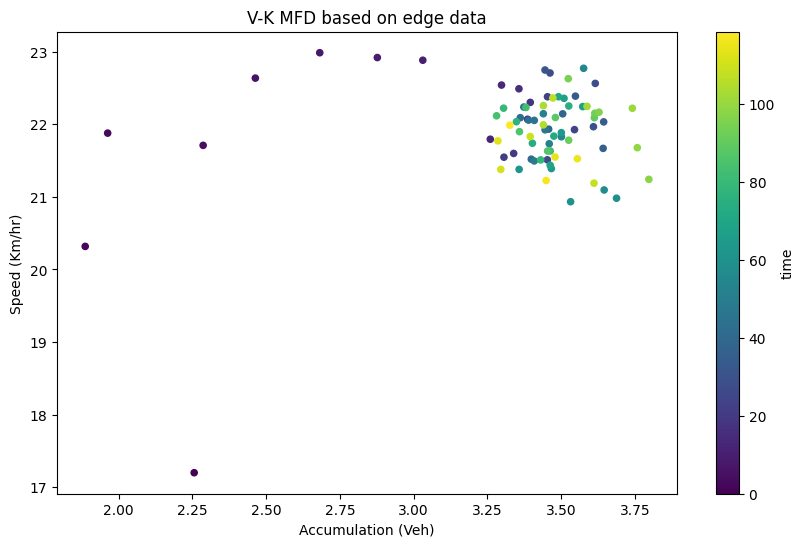

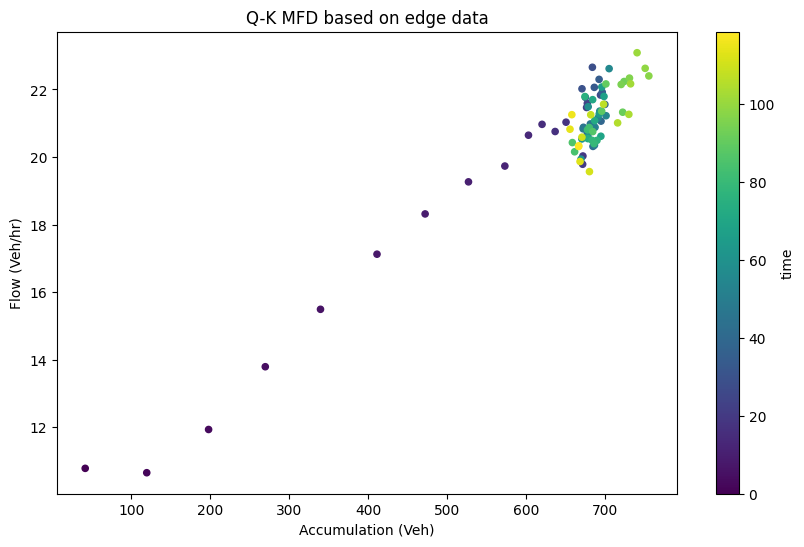

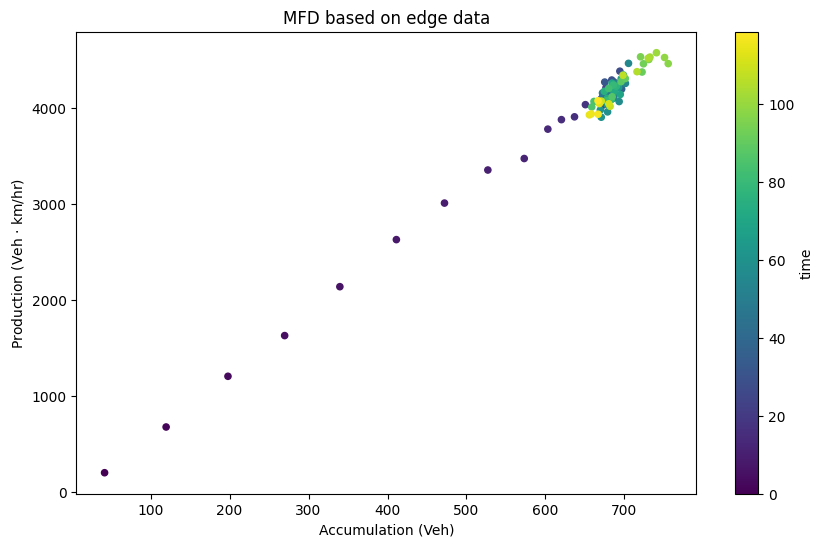

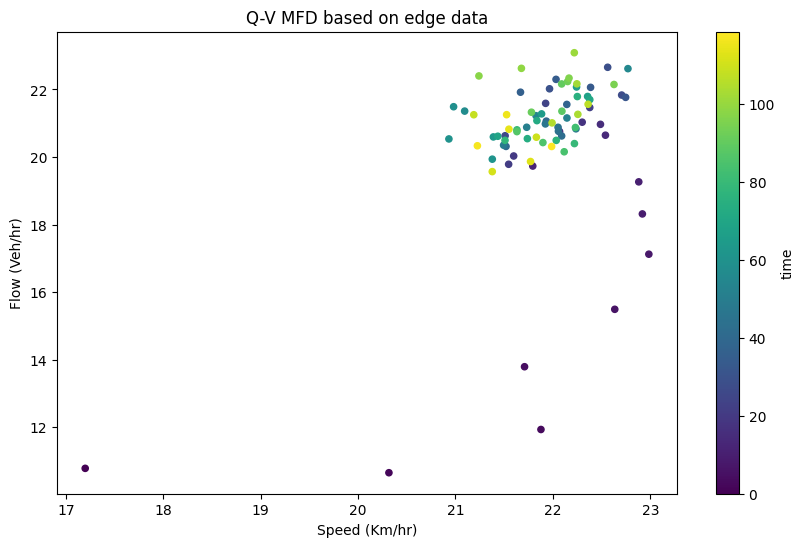

In [13]:
# calculating meandensity,meanflow,meanspeed (density=density)
i = 0
j = 0
MD = []
MS = []
MF = []
ACCUMULATION = []
PRODUCTION = []
while _beginvalues_[i] < (_lastsimulationperiod_):
    _net = __net[i]
    # Edie's definition
    # sampledSeconds (sum_k {tau_k}) = sum of the time spent by vehicles k within the time-space window, defined by link i and time interval [t, t + Δt]
    # link_accumulation (=l_i * K_i) : sampledSeconds / time_interval = average number of vehicles on link i during time interval [t, t + Δt]
    link_accumulation = (1/time_interval)*(df.sampledSeconds.iloc[j:j+_seg]) # #veh
    # numofveh (sum_i {l_i * K_i}) : number of vehicles on the whole network during time interval [t, t + Δt]
    numofveh = sum(link_accumulation) # #veh
    # sampledSeconds * speed (sum_k {d_k}) = sum of the total distance traveled by vehicles k within the time-space window, defined by link i and time interval [t, t + Δt]
    # link_weighted_flow (=l_i * Q_i) : sampledSeconds * speed / time_interval = average flow on link i during time interval [t, t + Δt]
    link_weighted_flow = (1/time_interval) * (df.sampledSeconds.iloc[j:j+_seg] * df.speed.iloc[j:j+_seg]) * 3.6 # #veh*km/hr (3.6 = 3600/1000)
    # speedznumofveh (=sum_i {l_i * Q_i}) : total weighted flow on the whole network during time interval [t, t + Δt]
    speedznumofveh = sum(link_weighted_flow) # #veh*km/hr
    if numofveh > 0:
        meanspeed_ = speedznumofveh/numofveh # km/hr
    else:
        meanspeed_ = 0
    meandensity_ = numofveh / _net # #veh/km
    meanflow_ = speedznumofveh / _net # #veh/hr
    MD.append(meandensity_)
    MS.append(meanspeed_)
    MF.append(meanflow_)
    ACCUMULATION.append(numofveh)
    PRODUCTION.append(speedznumofveh)
    
    # edge data
    edge_data = pd.DataFrame({'edge_id': df.edge_id.iloc[j:j+_seg],
                              'density': (1/df.Length.iloc[j:j+_seg]) * link_accumulation, # #veh/km
                              'speed': df.speed.iloc[j:j+_seg] * 3.6, # km/hr
                              'flow': (1/df.Length.iloc[j:j+_seg]) * link_weighted_flow, # #veh/hr
                              'accumulation': link_accumulation, # #veh
                              'link_weighted_flow': link_weighted_flow # #veh*km/hr
                              })
    edge_data.to_csv(f"{output_dir}/{setting}/edge/edge_data_{i}.csv", index=False)
    
    i = i+1
    j = j+_seg
    
# Build a csv file
Macro_Features = {'time': [t/60 for t in _beginvalues_[:-1]],
                  'density': MD,
                  'speed': MS,
                  'flow': MF,
                  'accumulation': ACCUMULATION,
                  'production': PRODUCTION
                  }
mfd_edge = pd.DataFrame(Macro_Features)
mfd_edge.to_csv(f"{output_dir}/{setting}/mfd/MFD_edge.csv", index=False)

# plot
fig, ax = plt.subplots(figsize=(10, 6))
mfd_edge.plot(x='density', y='speed', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Density (#veh/km)")
plt.ylabel("Speed (Km/hr)")
plt.title("V-K MFD based on edge data")
plt.savefig(f"{output_dir}/{setting}/mfd/v-k.png")

fig, ax = plt.subplots(figsize=(10, 6))
mfd_edge.plot(x='accumulation', y='flow', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Accumulation (Veh)")
plt.ylabel("Flow (Veh/hr)")
plt.title("Q-K MFD based on edge data")
plt.savefig(f"{output_dir}/{setting}/mfd/q-k.png")

fig, ax = plt.subplots(figsize=(10, 6))
mfd_edge.plot(x='accumulation', y='production', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Accumulation (Veh)")
plt.ylabel(r"Production (Veh $\cdot$ km/hr)")
plt.title("MFD based on edge data")
plt.savefig(f"{output_dir}/{setting}/mfd/mfd.png")

fig, ax = plt.subplots(figsize=(10, 6))
mfd_edge.plot(x='speed', y='flow', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Speed (Km/hr)")
plt.ylabel("Flow (Veh/hr)")
plt.title("Q-V MFD based on edge data")
plt.savefig(f"{output_dir}/{setting}/mfd/q-v.png")

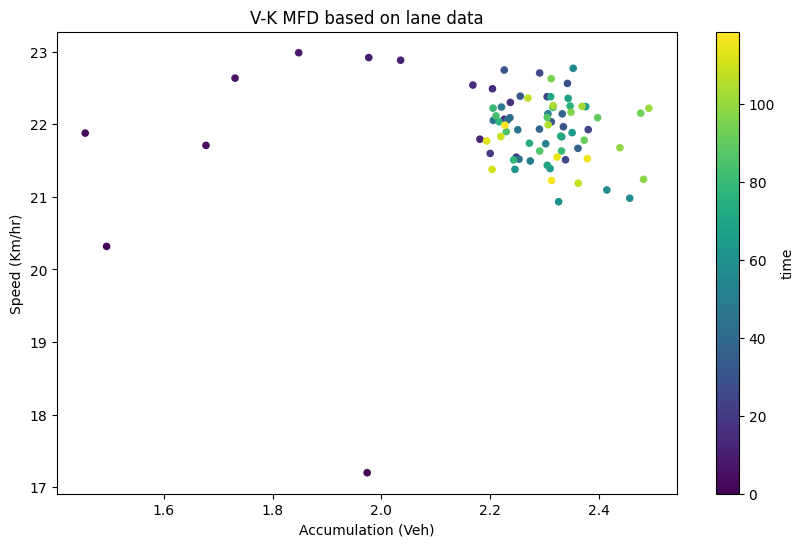

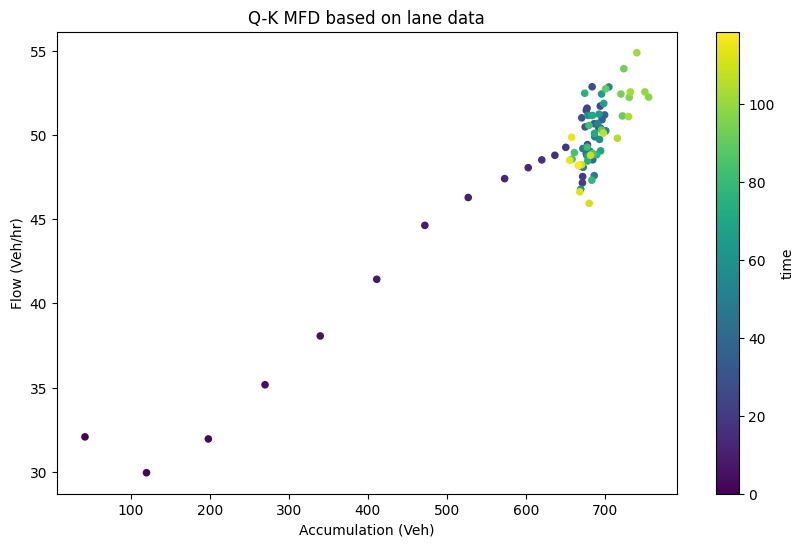

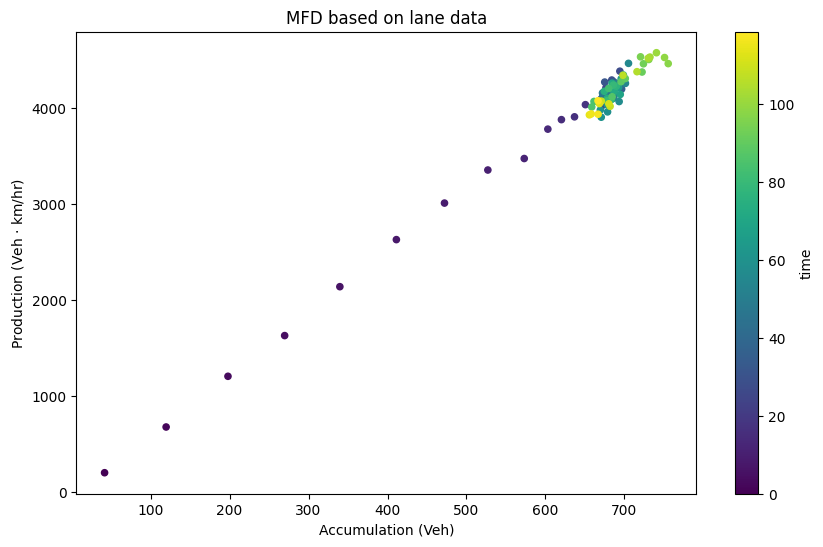

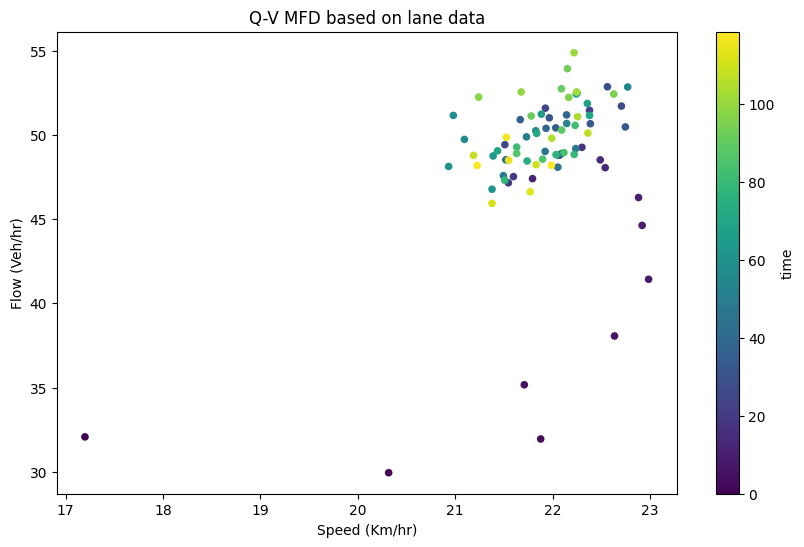

In [14]:
# calculating meandensity,meanflow,meanspeed (density=laneDensity)
i = 0
j = 0
lMD = []
lMS = []
lMF = []
lACCUMULATION = []
lPRODUCTION = []
while _beginvalues_[i] < (_lastsimulationperiod_):
    _net = __net[i]
    numofveh = (1/time_interval)*(sum(df.sampledSeconds.iloc[j:j+_seg])) # #veh
    speedznumofveh = (1/time_interval)*(sum(df.sampledSeconds.iloc[j:j+_seg]*df.speed.iloc[j:j+_seg]))*3.6 # #veh*km/hr
    if numofveh > 0:
        meanspeed_ = speedznumofveh/numofveh # km/hr
    else:
        meanspeed_ = 0
    meandensity_ = (sum(df.laneDensity.iloc[j:j+_seg]*df.Length.iloc[j:j+_seg]))/_net # #veh/km
    meanflow_ = (sum(df.laneDensity.iloc[j:j+_seg]*df.Length.iloc[j:j+_seg]*df.speed.iloc[j:j+_seg]*3.6))/_net # #veh/hr
    lMD.append(meandensity_)
    lMS.append(meanspeed_)
    lMF.append(meanflow_)
    lACCUMULATION.append(numofveh)
    lPRODUCTION.append(speedznumofveh)
    i = i+1
    j = j+_seg
        
# Build a csv file
Macro_Features = {'time': [t/60 for t in _beginvalues_[:-1]],
                  'density': lMD,
                  'speed': lMS,
                  'flow': lMF,
                  'accumulation': lACCUMULATION,
                  'production': lPRODUCTION
                  }
mfd_lane = pd.DataFrame(Macro_Features)
mfd_lane.to_csv(f"{output_dir}/{setting}/mfd/MFD_lane.csv", index=False)


# plot
fig, ax = plt.subplots(figsize=(10, 6))
mfd_lane.plot(x='density', y='speed', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Density (#veh/km)")
plt.ylabel("Speed (Km/hr)")
plt.title("V-K MFD based on lane data")
plt.savefig(f"{output_dir}/{setting}/mfd/l_v-k.png")

fig, ax = plt.subplots(figsize=(10, 6))
mfd_lane.plot(x='accumulation', y='flow', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Accumulation (Veh)")
plt.ylabel("Flow (Veh/hr)")
plt.title("Q-K MFD based on lane data")
plt.savefig(f"{output_dir}/{setting}/mfd/l_q-k.png")

fig, ax = plt.subplots(figsize=(10, 6))
mfd_lane.plot(x='accumulation', y='production', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Accumulation (Veh)")
plt.ylabel(r"Production (Veh $\cdot$ km/hr)")
plt.title("MFD based on lane data")
plt.savefig(f"{output_dir}/{setting}/mfd/l_mfd.png")

fig, ax = plt.subplots(figsize=(10, 6))
mfd_lane.plot(x='speed', y='flow', kind='scatter', ax=ax, c='time', colormap='viridis')
plt.xlabel("Speed (Km/hr)")
plt.ylabel("Flow (Veh/hr)")
plt.title("Q-V MFD based on lane data")
plt.savefig(f"{output_dir}/{setting}/mfd/l_q-v.png")

In [7]:
import pandas as pd
import numpy as np
from collections import Counter
import matplotlib.pyplot as plt
import pandas_read_xml as pdx
import os
from tqdm import tqdm

import pandas as pd
import pandas_read_xml as pdx
import numpy as np
from collections import Counter

# lxmlを使用してXMLファイルを解析する
import lxml.etree as ET

def process_chunk(chunk):
    chunk = pdx.flatten(chunk)
    chunk = chunk.pipe(pdx.flatten)
    chunk = chunk.pipe(pdx.flatten)
    chunk = chunk.pipe(pdx.flatten)
    chunk = chunk.rename({'@begin': 'begin', '@end': 'end',
                        'edge|@id': 'edge_id',
                        'edge|@sampledSeconds': 'sampledSeconds', 'edge|@density': 'density',
                        'edge|@laneDensity': 'laneDensity', 'edge|@speed': 'speed'}, axis=1)
    chunk = chunk.iloc[:, 1:]
    

    chunk['begin'] = chunk['begin'].astype(float)
    chunk['end'] = chunk['end'].astype(float)
    chunk["sampledSeconds"] = chunk["sampledSeconds"].astype(float)
    chunk["density"] = chunk["density"].astype(float)
    chunk["laneDensity"] = chunk["laneDensity"].astype(float)
    chunk["speed"] = chunk["speed"].astype(float)
    chunk = chunk.replace(np.NaN, 0)
    chunk['begin'] = chunk['begin'].astype(int)

    return chunk

def plot_mfd(MD, MS, MF, ACCUMULATION, PRODUCTION):
    # Build a csv file
    Macro_Features = {'time': [time_interval * t/60 for t in range(len(MD))],
                    'density': MD,
                    'speed': MS,
                    'flow': MF,
                    'accumulation': ACCUMULATION,
                    'production': PRODUCTION
                    }
    mfd_edge = pd.DataFrame(Macro_Features)
    mfd_edge.to_csv(f"{output_dir}/{setting}/mfd/MFD_edge.csv", index=False)

    # plot
    fig, ax = plt.subplots(figsize=(10, 6))
    mfd_edge.plot(x='density', y='speed', kind='scatter', ax=ax, c='time', colormap='viridis')
    plt.xlabel("Density (#veh/km)")
    plt.ylabel("Speed (Km/hr)")
    plt.title("V-K MFD based on edge data")
    plt.savefig(f"{output_dir}/{setting}/mfd/v-k.png")
    plt.close()

    fig, ax = plt.subplots(figsize=(10, 6))
    mfd_edge.plot(x='accumulation', y='flow', kind='scatter', ax=ax, c='time', colormap='viridis')
    plt.xlabel("Accumulation (Veh)")
    plt.ylabel("Flow (Veh/hr)")
    plt.title("Q-K MFD based on edge data")
    plt.savefig(f"{output_dir}/{setting}/mfd/q-k.png")
    plt.close()

    fig, ax = plt.subplots(figsize=(10, 6))
    mfd_edge.plot(x='accumulation', y='production', kind='scatter', ax=ax, c='time', colormap='viridis')
    plt.xlabel("Accumulation (Veh)")
    plt.ylabel(r"Production (Veh $\cdot$ km/hr)")
    plt.title("MFD based on edge data")
    plt.savefig(f"{output_dir}/{setting}/mfd/mfd.png")
    plt.close()

    fig, ax = plt.subplots(figsize=(10, 6))
    mfd_edge.plot(x='speed', y='flow', kind='scatter', ax=ax, c='time', colormap='viridis')
    plt.xlabel("Speed (Km/hr)")
    plt.ylabel("Flow (Veh/hr)")
    plt.title("Q-V MFD based on edge data")
    plt.savefig(f"{output_dir}/{setting}/mfd/q-v.png")
    plt.close()    


setting = '1.0normal_1.0evac_93'
output_dir = f'output'
edge_output_file = os.path.join(output_dir, setting, 'edge_data.xml')

# calculating meandensity,meanflow,meanspeed (density=density)
MD = []
MS = []
MF = []
ACCUMULATION = []
PRODUCTION = []
i = 0
context = ET.iterparse(edge_output_file, events=("end",), tag="interval")

for event, elem in tqdm(context, desc="Processing intervals"):
    if elem.tag == 'interval':
        chunk = ET.tostring(elem, encoding='utf8').decode('utf8')
        df_chunk = pdx.read_xml(chunk, ['interval'])
        df = process_chunk(df_chunk)
        
        # calculation time interval
        bft = df.begin.iloc[0]
        eft = df.end.iloc[0]
        time_interval = int(eft - bft)

        # calculating total length of network
        # 密度0のリンクはMFDの計算に含めないので、リンク長を0とする
        length = df['sampledSeconds'] / (df['end']-df['begin']) / df['density'] # km
        df['Length'] = length.replace(np.NaN, 0).replace(np.inf, 0) # km
        _net = sum(df.Length)

        # Edie's definition
        # sampledSeconds (sum_k {tau_k}) = sum of the time spent by vehicles k within the time-space window, defined by link i and time interval [t, t + Δt]
        # link_accumulation (=l_i * K_i) : sampledSeconds / time_interval = average number of vehicles on link i during time interval [t, t + Δt]
        link_accumulation = (1/time_interval)*(df.sampledSeconds) # #veh
        # numofveh (sum_i {l_i * K_i}) : number of vehicles on the whole network during time interval [t, t + Δt]
        numofveh = sum(link_accumulation) # #veh
        # sampledSeconds * speed (sum_k {d_k}) = sum of the total distance traveled by vehicles k within the time-space window, defined by link i and time interval [t, t + Δt]
        # link_weighted_flow (=l_i * Q_i) : sampledSeconds * speed / time_interval = average flow on link i during time interval [t, t + Δt]
        link_weighted_flow = (1/time_interval) * (df.sampledSeconds * df.speed) * 3.6 # #veh*km/hr (3.6 = 3600/1000)
        # speedznumofveh (=sum_i {l_i * Q_i}) : total weighted flow on the whole network during time interval [t, t + Δt]
        speedznumofveh = sum(link_weighted_flow) # #veh*km/hr
        if numofveh > 0:
            meanspeed_ = speedznumofveh/numofveh # km/hr
        else:
            meanspeed_ = 0
        meandensity_ = numofveh / _net # #veh/km
        meanflow_ = speedznumofveh / _net # #veh/hr
        MD.append(meandensity_)
        MS.append(meanspeed_)
        MF.append(meanflow_)
        ACCUMULATION.append(numofveh)
        PRODUCTION.append(speedznumofveh)
        
        # edge data
        if i % (time_interval) == 0:
            edge_data = pd.DataFrame({'edge_id': df.edge_id,
                                    'density': (1/df.Length) * link_accumulation, # #veh/km
                                    'speed': df.speed * 3.6, # km/hr
                                    'flow': (1/df.Length) * link_weighted_flow, # #veh/hr
                                    'accumulation': link_accumulation, # #veh
                                    'link_weighted_flow': link_weighted_flow, # #veh*km/hr
                                    'length': df.Length # km
                                    })
            edge_data.to_csv(f"{output_dir}/{setting}/edge/edge_data_{i}.csv", index=False)
        
    i += time_interval
    
    # Clear the processed element from memory
    elem.clear()
    while elem.getprevious() is not None:
        del elem.getparent()[0]


Processing intervals: 97it [01:05,  1.47it/s]


: 

In [33]:
plot_mfd(MD, MS, MF, ACCUMULATION, PRODUCTION)

# シミュレーション結果の可視化

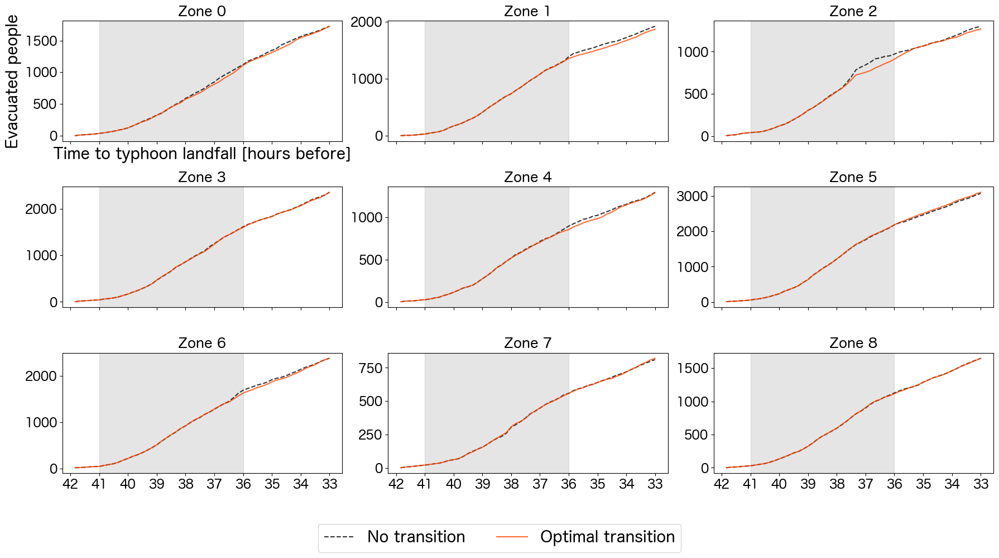


=== 各シナリオのゾーン別最大避難人数 ===


【No transition】
  ゾーン 0: 1725.0 人
  ゾーン 1: 1925.0 人
  ゾーン 2: 1300.0 人
  ゾーン 3: 2351.0 人
  ゾーン 4: 1298.0 人
  ゾーン 5: 3076.0 人
  ゾーン 6: 2378.0 人
  ゾーン 7: 811.0 人
  ゾーン 8: 1649.0 人

【Optimal transition】
  ゾーン 0: 1723.0 人
  ゾーン 1: 1872.0 人
  ゾーン 2: 1268.0 人
  ゾーン 3: 2347.0 人
  ゾーン 4: 1291.0 人
  ゾーン 5: 3110.0 人
  ゾーン 6: 2379.0 人
  ゾーン 7: 821.0 人
  ゾーン 8: 1649.0 人


In [13]:
# ゾーンごとの避難人数の時系列遷移を可視化
import glob
import matplotlib.pyplot as plt
# 日本語フォントの設定
import matplotlib
matplotlib.rcParams['font.family'] = 'Hiragino Maru Gothic Pro'  # macOSの場合

import pandas as pd
import numpy as np

# 3つのシナリオのディレクトリパス
normal = 0.8
evac = 1.0
demand_scenario = 93

folders = {
    'No transition': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_noreconf_93_reroute0.3',
    'Optimal transition': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_evac_93_reroute0.3',
    #'Worst transition': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_worst_93_reroute0.3',
}
line_styles = {key: value for key, value in zip(folders.keys(), ['--', '-', ':'])}
colors = {key: value for key, value in zip(folders.keys(), ['black', 'orangered', 'blue'])}

"""
folders = {
    'z1': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_evac_53_reroute0.3',
    'z2': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_normal_53_reroute0.3',
}
line_styles = {key: value for key, value in zip(folders.keys(), ['-', '-'])}
colors = {key: value for key, value in zip(folders.keys(), ['blue', 'orangered'])}
"""

scenarios = {key: value + '/simulation_summary' for key, value in folders.items()}

# 各シナリオのデータを読み込む
all_data = {}
for scenario_name, dir_path in scenarios.items():
    csv_files = sorted(glob.glob(f"{dir_path}/zone_statistics_summary_*.csv"))
    
    scenario_data = []
    for csv_file in csv_files:
        df = pd.read_csv(csv_file)
        scenario_data.append(df)
    
    # 全時刻のデータを結合
    combined_df = pd.concat(scenario_data, ignore_index=True)
    all_data[scenario_name] = combined_df

# ゾーンIDのリストを取得（全シナリオで共通のはず）
zone_ids = sorted(all_data[list(scenarios.keys())[0]]['zone_id'].unique())

# 時系列データを整理
time_series_data = {}
for scenario_name, df in all_data.items():
    time_series_data[scenario_name] = {}
    for zone_id in zone_ids:
        zone_data = df[df['zone_id'] == zone_id].sort_values('time')
        time_series_data[scenario_name][zone_id] = {
            'time': zone_data['time'].values,
            'occupancy': zone_data['occupancy'].values
        }

# all_dataのすべてのデータに共通に含まれる時間のみ使用
common_times = set.intersection(*[set(df['time'].unique()) for df in all_data.values()])
for scenario_name in scenarios.keys():
    for zone_id in zone_ids:
        mask = np.isin(time_series_data[scenario_name][zone_id]['time'], list(common_times))
        time_series_data[scenario_name][zone_id]['time'] = time_series_data[scenario_name][zone_id]['time'][mask]
        time_series_data[scenario_name][zone_id]['occupancy'] = time_series_data[scenario_name][zone_id]['occupancy'][mask]

# 可視化（3×3のサブプロットで1枚の図にまとめる）
import math

ncols = 3
nrows = math.ceil(len(zone_ids) / ncols)
fig, axes = plt.subplots(nrows=nrows, ncols=ncols, figsize=(18, 3 * nrows), sharex=True, sharey=False)

# 2次元配列にして使いやすく
axes = np.array(axes).reshape(-1)

for idx, zone_id in enumerate(zone_ids):
    ax = axes[idx]
    
    for scenario_name in scenarios.keys():
        data = time_series_data[scenario_name][zone_id]
        # 時刻を時間（秒）から時間（時）に変換
        time_hours = (data['time'] + 1) / 3600.0 - 48.0
        ax.plot(time_hours, data['occupancy'], label=scenario_name, linewidth=1.5, linestyle=line_styles[scenario_name], color=colors[scenario_name], alpha=0.8)
    # time_hoursが6から12の間にグレーの帯
    ax.axvspan(7-48, 12-48, color='gray', alpha=0.2)
    xticks = [-42] + time_hours[5::6].tolist()
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{int(-t)}" for t in xticks], fontsize=16)
    ax.set_title(f'Zone {zone_id}', fontsize=18, fontweight='bold')
    ax.tick_params(axis='y', labelsize=16)
    #ax.legend(fontsize=12)
    #ax.grid(True, alpha=0.3)
    #ax.set_xlim(left=6.0)
    if idx == 0:
        ax.set_xlabel('Time to typhoon landfall [hours before]', fontsize=20)
        ax.set_ylabel('Evacuated people', fontsize=20)

# 使わないサブプロットを非表示に
for ax in axes[len(zone_ids):]:
    ax.axis('off')

# 凡例をまとめて表示
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=20, ncol=len(scenarios), bbox_to_anchor=(0.5, -0.12))
plt.tight_layout()
plt.show()

# 統計情報を表示
print("\n=== 各シナリオのゾーン別最大避難人数 ===\n")
for scenario_name in scenarios.keys():
    print(f"\n【{scenario_name}】")
    df = all_data[scenario_name]
    max_occupancy = df.groupby('zone_id')['occupancy'].max()
    for zone_id in sorted(max_occupancy.index):
        print(f"  ゾーン {zone_id}: {max_occupancy[zone_id]:.1f} 人")


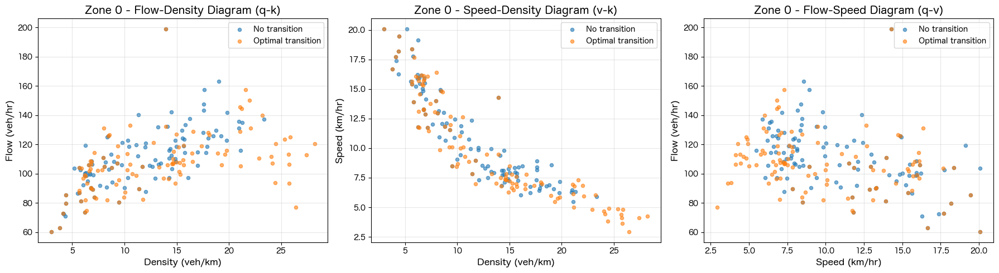

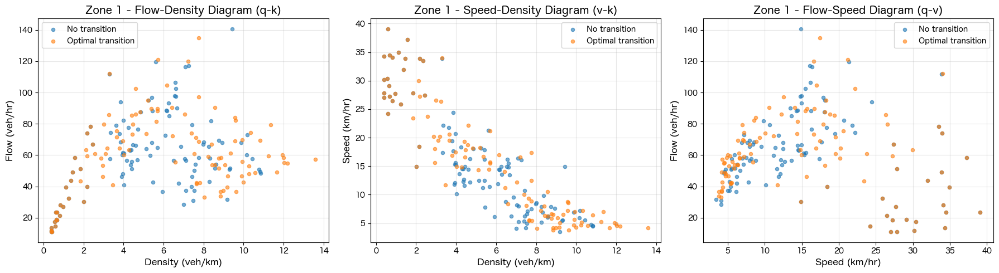

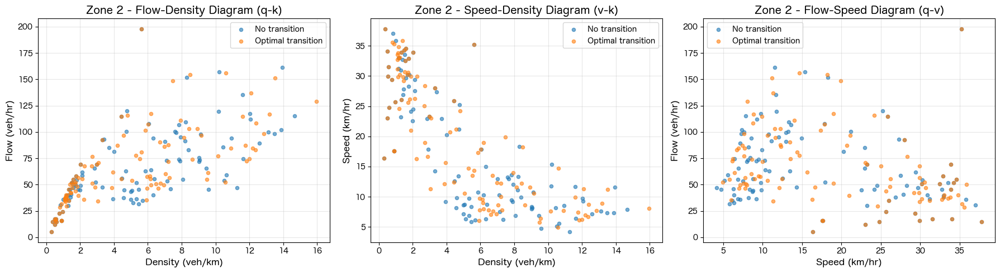

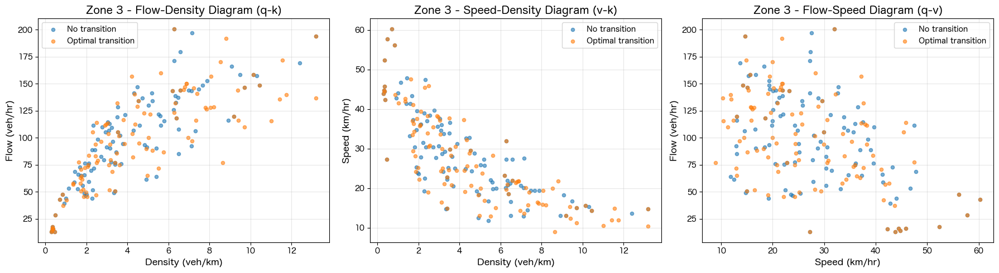

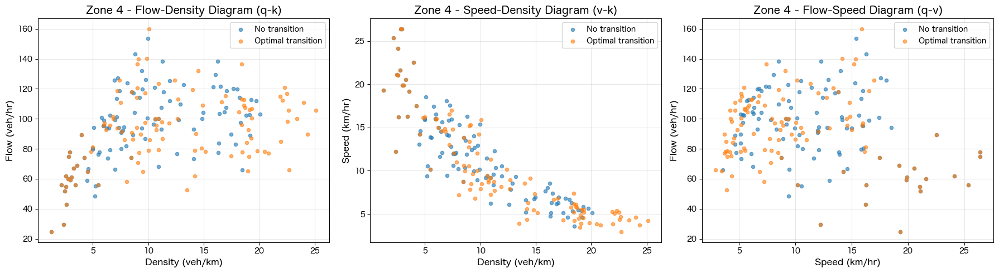

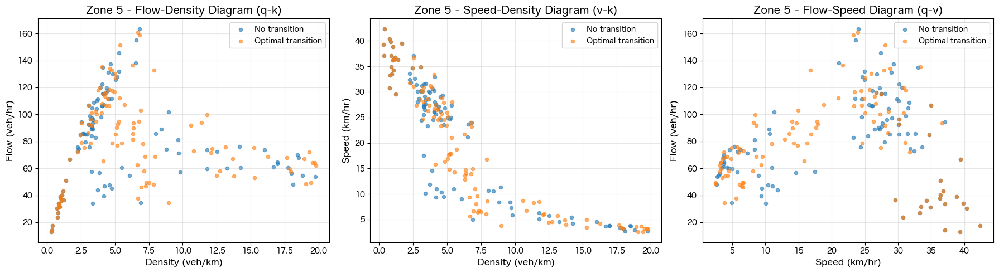

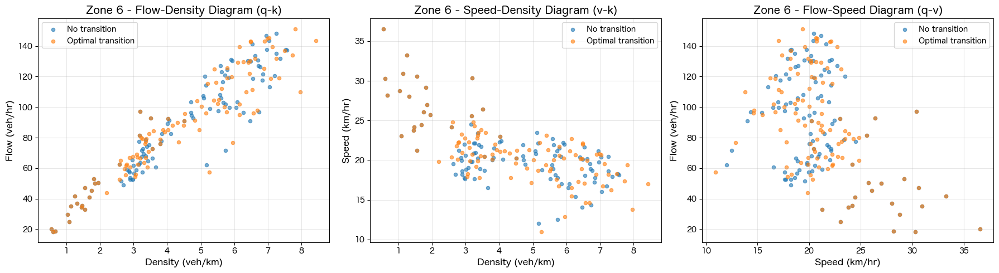

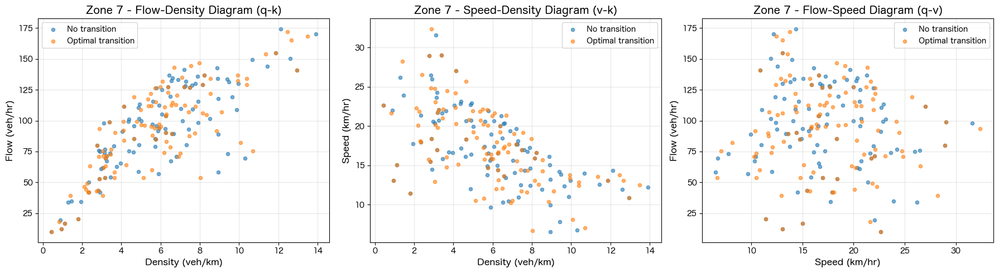

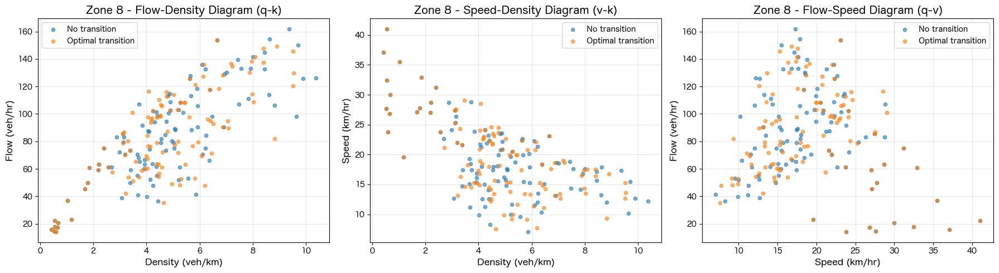


=== 各ケース・ゾーンのMFD統計情報 ===


【No transition】
  ゾーン 0:
    最大密度: 23.35 veh/km
    最大流量: 199.13 veh/hr
    最大速度: 20.09 km/hr
    平均密度: 11.54 veh/km
    平均流量: 110.05 veh/hr
    平均速度: 11.05 km/hr
  ゾーン 1:
    最大密度: 10.84 veh/km
    最大流量: 140.80 veh/hr
    最大速度: 39.10 km/hr
    平均密度: 5.28 veh/km
    平均流量: 60.00 veh/hr
    平均速度: 15.75 km/hr
  ゾーン 2:
    最大密度: 14.67 veh/km
    最大流量: 198.01 veh/hr
    最大速度: 37.82 km/hr
    平均密度: 5.34 veh/km
    平均流量: 64.98 veh/hr
    平均速度: 17.96 km/hr
  ゾーン 3:
    最大密度: 13.20 veh/km
    最大流量: 200.89 veh/hr
    最大速度: 60.29 km/hr
    平均密度: 4.27 veh/km
    平均流量: 97.99 veh/hr
    平均速度: 28.42 km/hr
  ゾーン 4:
    最大密度: 20.08 veh/km
    最大流量: 153.60 veh/hr
    最大速度: 26.42 km/hr
    平均密度: 9.63 veh/km
    平均流量: 93.04 veh/hr
    平均速度: 12.12 km/hr
  ゾーン 5:
    最大密度: 19.77 veh/km
    最大流量: 163.55 veh/hr
    最大速度: 42.38 km/hr
    平均密度: 5.70 veh/km
    平均流量: 79.69 veh/hr
    平均速度: 22.83 km/hr
  ゾーン 6:
    最大密度: 7.56 veh/km
    最大流量: 148.21 veh/hr
    最大速度: 36.57 km/hr
    平均密

In [14]:
# ゾーンごとのMFDを計算・可視化
import glob
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# ゾーニングファイルを読み込む
zoning_file = '/Users/masudasatoki/Desktop/MFD_evac/code/network_partitioning/zoning.csv'
zoning_df = pd.read_csv(zoning_file)

# エッジIDとゾーンの対応関係を作成
edge_to_zone = {}
for col in zoning_df.columns:
    zone_id = int(col.split('_')[1])  # cluster_0 -> 0
    edges = zoning_df[col].dropna().astype(str).values
    for edge in edges:
        # エッジIDの正規化（マイナス記号の処理）
        edge_clean = edge.strip()
        edge_to_zone[edge_clean] = zone_id
        # マイナス記号がある場合、両方の形式を登録
        if edge_clean.startswith('-'):
            edge_to_zone[edge_clean[1:]] = zone_id

# ケースのディレクトリ
cases = {key: value + '/edge' for key, value in folders.items()}

# ゾーン数
num_zones = len(zoning_df.columns)

# 各ケース、各ゾーンのMFDデータを計算
zone_mfd_data = {}
for case_name, edge_dir in cases.items():
    zone_mfd_data[case_name] = {zone: {'density': [], 'speed': [], 'flow': [], 'time': []} 
                                 for zone in range(num_zones)}
    
    # エッジデータファイルを時系列で読み込む
    edge_files = sorted(glob.glob(f"{edge_dir}/edge_data_*.csv"))
    
    for edge_file in edge_files:
        # 時刻をファイル名から取得
        time = int(edge_file.split('_')[-1].split('.')[0])
        
        # エッジデータを読み込む
        edge_data = pd.read_csv(edge_file)
        
        # 数値列を数値型に変換（空の値はNaN）
        numeric_cols = ['density', 'speed', 'flow', 'accumulation', 'link_weighted_flow', 'length']
        for col in numeric_cols:
            edge_data[col] = pd.to_numeric(edge_data[col], errors='coerce')
        
        # ゾーンごとに集計
        # エッジIDを文字列に変換してゾーンを取得
        edge_data['zone'] = edge_data['edge_id'].astype(str).map(
            lambda x: edge_to_zone.get(str(x).strip(), -1)
        )
        
        for zone_id in range(num_zones):
            # このゾーンに属するエッジを抽出
            zone_edges = edge_data[edge_data['zone'] == zone_id]
            
            # 有効なデータのみを使用（NaNや0の長さを除外）
            valid_edges = zone_edges[
                (zone_edges['length'].notna()) & 
                (zone_edges['length'] > 0) &
                (zone_edges['accumulation'].notna())
            ]
            
            if len(valid_edges) > 0:
                # Edieの定義に基づいてMFDを計算
                # ネットワーク長
                net_length = valid_edges['length'].sum()  # km
                
                # 車両数（accumulationの合計）
                num_veh = valid_edges['accumulation'].sum()  # veh
                
                # 重み付き流量（link_weighted_flowの合計）
                weighted_flow = valid_edges['link_weighted_flow'].sum()  # veh*km/hr
                
                if net_length > 0:
                    # 密度 (veh/km)
                    density = num_veh / net_length
                    
                    # 流量 (veh/hr)
                    flow = weighted_flow / net_length
                    
                    # 速度 (km/hr)
                    if num_veh > 0:
                        speed = weighted_flow / num_veh
                    else:
                        speed = 0
                    
                    zone_mfd_data[case_name][zone_id]['density'].append(density)
                    zone_mfd_data[case_name][zone_id]['speed'].append(speed)
                    zone_mfd_data[case_name][zone_id]['flow'].append(flow)
                    zone_mfd_data[case_name][zone_id]['time'].append(time)

# 可視化：各ゾーンごとに3つのMFD図を表示
for zone_id in range(num_zones):
    fig, axes = plt.subplots(1, 3, figsize=(18, 5))
    
    # 1. Flow vs Density (q-k図)
    ax1 = axes[0]
    for case_name in cases.keys():
        data = zone_mfd_data[case_name][zone_id]
        if len(data['density']) > 0:
            ax1.scatter(data['density'], data['flow'], label=case_name, alpha=0.6, s=20)
    ax1.set_xlabel('Density (veh/km)', fontsize=12)
    ax1.set_ylabel('Flow (veh/hr)', fontsize=12)
    ax1.set_title(f'Zone {zone_id} - Flow-Density Diagram (q-k)', fontsize=14, fontweight='bold')
    ax1.legend(fontsize=10)
    ax1.grid(True, alpha=0.3)
    
    # 2. Speed vs Density (v-k図)
    ax2 = axes[1]
    for case_name in cases.keys():
        data = zone_mfd_data[case_name][zone_id]
        if len(data['density']) > 0:
            ax2.scatter(data['density'], data['speed'], label=case_name, alpha=0.6, s=20)
    ax2.set_xlabel('Density (veh/km)', fontsize=12)
    ax2.set_ylabel('Speed (km/hr)', fontsize=12)
    ax2.set_title(f'Zone {zone_id} - Speed-Density Diagram (v-k)', fontsize=14, fontweight='bold')
    ax2.legend(fontsize=10)
    ax2.grid(True, alpha=0.3)
    
    # 3. Flow vs Speed (q-v図)
    ax3 = axes[2]
    for case_name in cases.keys():
        data = zone_mfd_data[case_name][zone_id]
        if len(data['speed']) > 0:
            ax3.scatter(data['speed'], data['flow'], label=case_name, alpha=0.6, s=20)
    ax3.set_xlabel('Speed (km/hr)', fontsize=12)
    ax3.set_ylabel('Flow (veh/hr)', fontsize=12)
    ax3.set_title(f'Zone {zone_id} - Flow-Speed Diagram (q-v)', fontsize=14, fontweight='bold')
    ax3.legend(fontsize=10)
    ax3.grid(True, alpha=0.3)
    
    plt.tight_layout()
    plt.show()

# 統計情報を表示
print("\n=== 各ケース・ゾーンのMFD統計情報 ===\n")
for case_name in cases.keys():
    print(f"\n【{case_name}】")
    for zone_id in range(num_zones):
        data = zone_mfd_data[case_name][zone_id]
        if len(data['density']) > 0:
            print(f"  ゾーン {zone_id}:")
            print(f"    最大密度: {max(data['density']):.2f} veh/km")
            print(f"    最大流量: {max(data['flow']):.2f} veh/hr")
            print(f"    最大速度: {max(data['speed']):.2f} km/hr")
            print(f"    平均密度: {np.mean(data['density']):.2f} veh/km")
            print(f"    平均流量: {np.mean(data['flow']):.2f} veh/hr")
            print(f"    平均速度: {np.mean(data['speed']):.2f} km/hr")


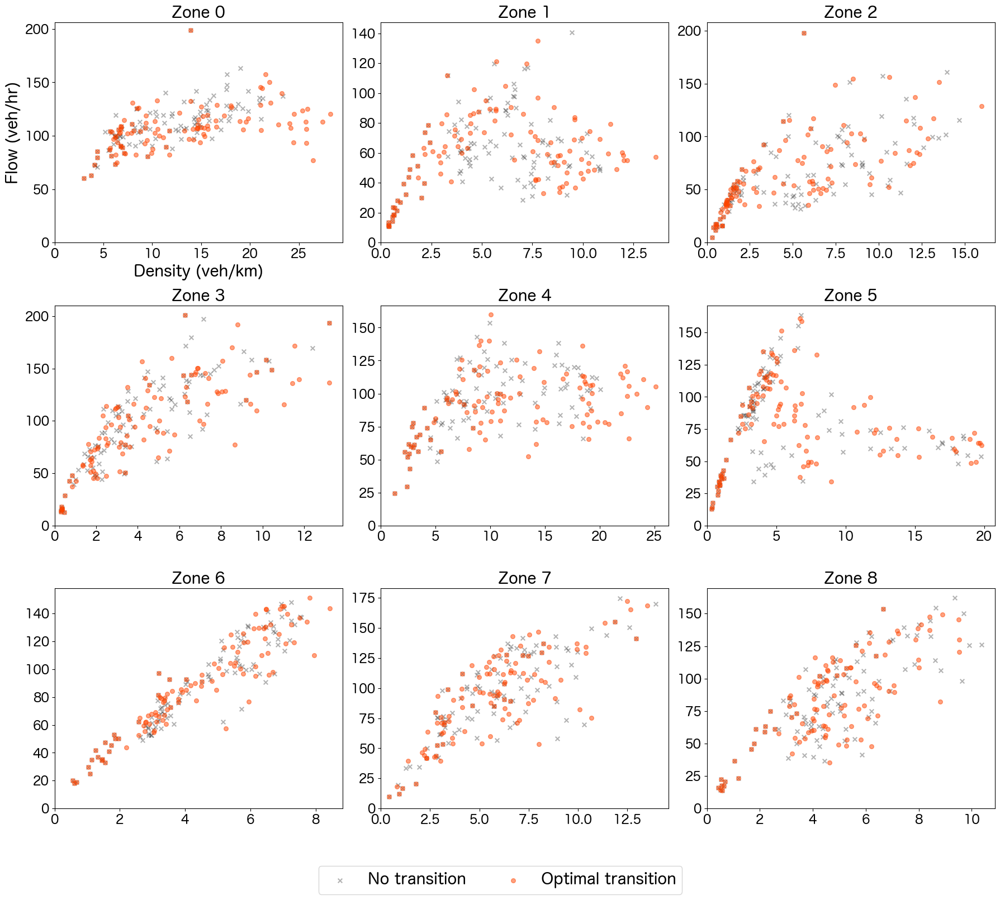

In [15]:
# q-k図を3行3列の1つの図として表示
fig, axes = plt.subplots(3, 3, figsize=(18, 15))
axes = axes.flatten()  # 2次元配列を1次元に変換
shape = {key: value for key, value in zip(scenarios.keys(), ['x', 'o', 'o'])}
alphas = {key: value for key, value in zip(scenarios.keys(), [0.3, 0.5, 0.5])}

for zone_id in range(num_zones):
    ax = axes[zone_id]
    
    # Flow vs Density (q-k図)
    for case_name in scenarios.keys():
        data = zone_mfd_data[case_name][zone_id]
        if len(data['density']) > 0:
            ax.scatter(data['density'], data['flow'], label=case_name, alpha=alphas[case_name], s=30, marker=shape[case_name], color=colors[case_name])
    ax.set_xlim(left=0)
    ax.set_ylim(bottom=0)
    ax.tick_params(axis='x', labelsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.set_title(f'Zone {zone_id}', fontsize=20, fontweight='bold')
    if zone_id == 0:  # 最初のサブプロットのみ凡例を表示
        ax.set_xlabel('Density (veh/km)', fontsize=20)
        ax.set_ylabel('Flow (veh/hr)', fontsize=20)
    #ax.grid(True, alpha=0.3)
# 凡例
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=20, ncol=len(scenarios), bbox_to_anchor=(0.5, -0.08))
plt.tight_layout()
plt.show()


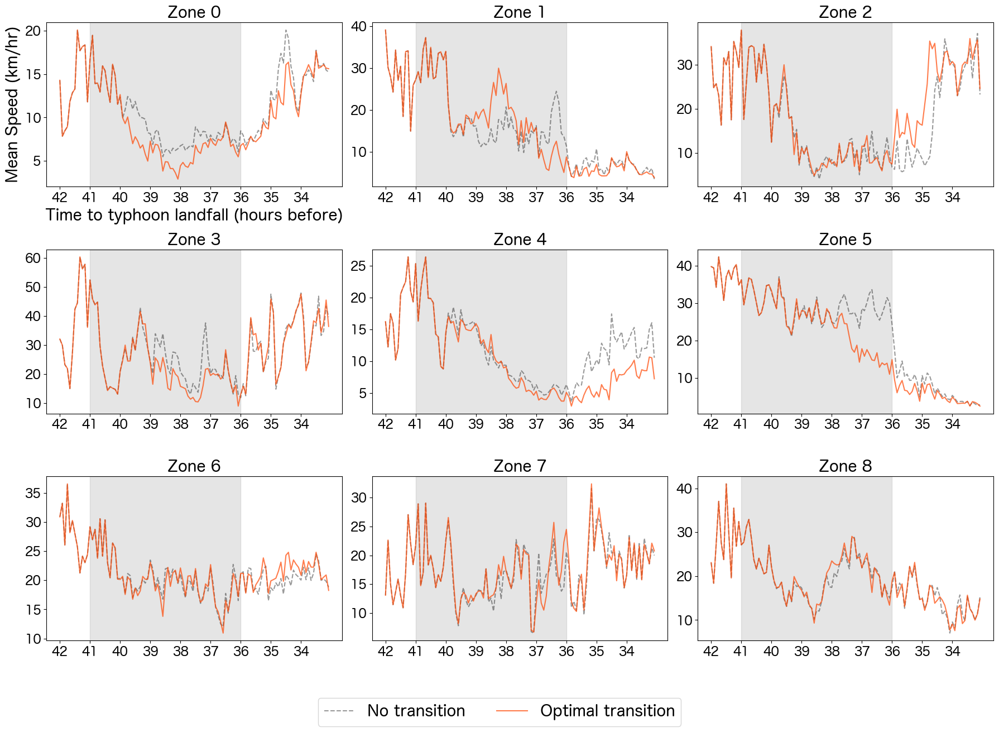

In [16]:
# ゾーンごとの平均速度の時間変化を3行3列のサブプロットで表示
fig, axes = plt.subplots(3, 3, figsize=(18, 12))
axes = axes.flatten()  # 2次元配列を1次元に変換
alphas = {key: value for key, value in zip(cases.keys(), [0.4, 0.7, 0.7, 0.7, 0.4, 0.7])}


for zone_id in range(num_zones):
    ax = axes[zone_id]
    
    for idx, case_name in enumerate(cases.keys()):
        data = zone_mfd_data[case_name][zone_id]
        if len(data['time']) > 0 and len(data['speed']) > 0:
            # 時刻を時間（秒）から時間（分）に変換
            time_hours = np.array(data['time']) / 3600.0 + 6 - 48
            speeds = np.array(data['speed'])
            
            # 時系列でソート
            sorted_indices = np.argsort(time_hours)
            time_sorted = time_hours[sorted_indices]
            speeds_sorted = speeds[sorted_indices]
            
            # プロット（ケースごとに線種を変える）
            ax.plot(time_sorted, speeds_sorted,
                   label=case_name,
                   alpha=alphas[case_name],
                   linewidth=1.5,
                   linestyle=line_styles[case_name],
                   color=colors[case_name])
    # 7-12の間にグレーの帯
    ax.axvspan(7-48, 12-48, color='gray', alpha=0.2)
    xticks = time_sorted[::12].tolist()
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{int(-t)}" for t in xticks], fontsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.set_title(f'Zone {zone_id}', fontsize=20, fontweight='bold')
    if zone_id == 0:  # 最初のサブプロットのみ凡例を表示
        ax.set_xlabel('Time to typhoon landfall (hours before)', fontsize=20)
        ax.set_ylabel('Mean Speed (km/hr)', fontsize=20)
    #ax.grid(True, alpha=0.3)
    #ax.set_xlim(left=0)
# 判例
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=20, ncol=len(cases), bbox_to_anchor=(0.5, -0.1))

plt.tight_layout()
plt.show()


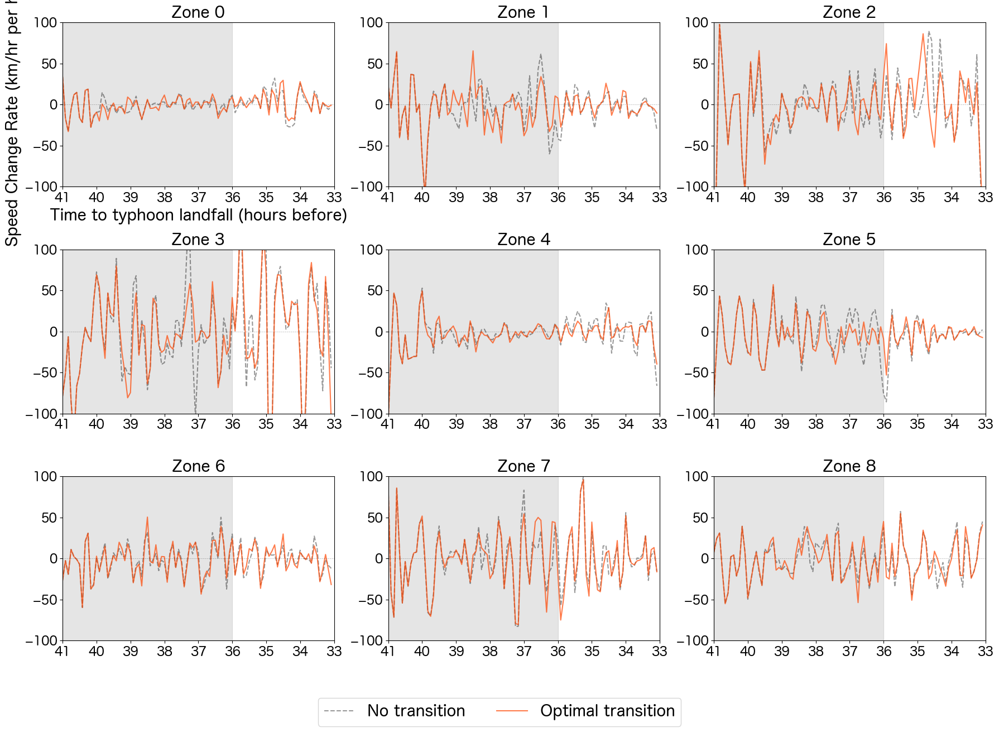

In [18]:
# ゾーンごとの平均速度の変化率の時間変化を3行3列のサブプロットで表示
fig, axes = plt.subplots(3, 3, figsize=(18, 12))
axes = axes.flatten()  # 2次元配列を1次元に変換
alphas = {key: value for key, value in zip(cases.keys(), [0.4, 0.7, 0.7, 0.7, 0.4, 0.7])}

# 時間範囲を設定（-41から-34時間前）
time_min = -41
time_max = -33

for zone_id in range(num_zones):
    ax = axes[zone_id]
    
    for idx, case_name in enumerate(cases.keys()):
        data = zone_mfd_data[case_name][zone_id]
        if len(data['time']) > 0 and len(data['speed']) > 0:
            # 時刻を時間（秒）から時間（時）に変換
            time_hours = np.array(data['time']) / 3600.0 + 6 - 48
            speeds = np.array(data['speed'])
            
            # 時系列でソート
            sorted_indices = np.argsort(time_hours)
            time_sorted = time_hours[sorted_indices]
            speeds_sorted = speeds[sorted_indices]
            
            # 時間範囲でフィルタリング
            mask = (time_sorted >= time_min) & (time_sorted <= time_max)
            time_filtered = time_sorted[mask]
            speeds_filtered = speeds_sorted[mask]
            
            # 速度の変化率を計算（時間に対する微分）
            # np.gradientは中央差分を使用して勾配を計算
            if len(time_filtered) > 1:
                speed_rate = np.gradient(speeds_filtered, time_filtered)  # km/hr per hour
                
                # プロット（ケースごとに線種を変える）
                ax.plot(time_filtered, speed_rate,
                       label=case_name,
                       alpha=alphas[case_name],
                       linewidth=1.5,
                       linestyle=line_styles[case_name],
                       color=colors[case_name])
    # 7-12の間にグレーの帯
    ax.axvspan(7-48, 12-48, color='gray', alpha=0.2)
    ax.axhline(y=0, color='black', linestyle='--', linewidth=0.5, alpha=0.3)  # y=0の基準線
    # 時間範囲を設定
    ax.set_xlim(time_min, time_max)
    # y軸の範囲を設定（全てのプロットで統一）
    ax.set_ylim(-100, 100)
    # xticksを設定
    xticks = np.arange(time_min, time_max + 1, 1)
    ax.set_xticks(xticks)
    ax.set_xticklabels([f"{int(-t)}" for t in xticks], fontsize=16)
    ax.tick_params(axis='y', labelsize=16)
    ax.set_title(f'Zone {zone_id}', fontsize=20, fontweight='bold')
    if zone_id == 0:  # 最初のサブプロットのみ凡例を表示
        ax.set_xlabel('Time to typhoon landfall (hours before)', fontsize=20)
        ax.set_ylabel('Speed Change Rate (km/hr per hour)', fontsize=20)
    #ax.grid(True, alpha=0.3)
# 判例
handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=20, ncol=len(cases), bbox_to_anchor=(0.5, -0.1))

plt.tight_layout()
plt.show()

In [19]:
# 全時間帯を通じた速度変化率の大きさを比較
# 各ゾーン・各ケースでの速度変化率の統計量を計算

speed_rate_stats = {}

for case_name in cases.keys():
    speed_rate_stats[case_name] = {}
    for zone_id in range(num_zones):
        data = zone_mfd_data[case_name][zone_id]
        if len(data['time']) > 0 and len(data['speed']) > 0:
            # 時刻を時間（秒）から時間（時）に変換
            time_hours = np.array(data['time']) / 3600.0 + 6 - 48
            speeds = np.array(data['speed'])
            
            # 時系列でソート
            sorted_indices = np.argsort(time_hours)
            time_sorted = time_hours[sorted_indices]
            speeds_sorted = speeds[sorted_indices]
            
            # 速度の変化率を計算（全時間帯）
            if len(time_sorted) > 1:
                speed_rate = np.gradient(speeds_sorted, time_sorted)  # km/hr per hour
                
                # 統計量を計算
                speed_rate_stats[case_name][zone_id] = {
                    'mean_abs_rate': np.mean(np.abs(speed_rate)),  # 絶対値の平均
                    'max_abs_rate': np.max(np.abs(speed_rate)),    # 絶対値の最大値
                    'std_rate': np.std(speed_rate),                # 標準偏差
                    'rms_rate': np.sqrt(np.mean(speed_rate**2)),   # RMS（二乗平均平方根）
                    'total_variation': np.sum(np.abs(np.diff(speed_rate)))  # 総変動量
                }
            else:
                speed_rate_stats[case_name][zone_id] = {
                    'mean_abs_rate': 0,
                    'max_abs_rate': 0,
                    'std_rate': 0,
                    'rms_rate': 0,
                    'total_variation': 0
                }
        else:
            speed_rate_stats[case_name][zone_id] = {
                'mean_abs_rate': 0,
                'max_abs_rate': 0,
                'std_rate': 0,
                'rms_rate': 0,
                'total_variation': 0
            }

# 統計情報を表示
print("=== 全時間帯を通じた速度変化率の統計情報 ===\n")
for case_name in cases.keys():
    print(f"\n【{case_name}】")
    for zone_id in range(num_zones):
        stats = speed_rate_stats[case_name][zone_id]
        print(f"  ゾーン {zone_id}:")
        print(f"    平均絶対変化率: {stats['mean_abs_rate']:.2f} km/hr per hour")
        print(f"    最大絶対変化率: {stats['max_abs_rate']:.2f} km/hr per hour")
        print(f"    標準偏差: {stats['std_rate']:.2f} km/hr per hour")
        print(f"    RMS: {stats['rms_rate']:.2f} km/hr per hour")

=== 全時間帯を通じた速度変化率の統計情報 ===


【No transition】
  ゾーン 0:
    平均絶対変化率: 11.43 km/hr per hour
    最大絶対変化率: 77.31 km/hr per hour
    標準偏差: 16.33 km/hr per hour
    RMS: 16.33 km/hr per hour
  ゾーン 1:
    平均絶対変化率: 22.77 km/hr per hour
    最大絶対変化率: 114.00 km/hr per hour
    標準偏差: 32.64 km/hr per hour
    RMS: 32.96 km/hr per hour
  ゾーン 2:
    平均絶対変化率: 30.74 km/hr per hour
    最大絶対変化率: 165.38 km/hr per hour
    標準偏差: 41.81 km/hr per hour
    RMS: 41.88 km/hr per hour
  ゾーン 3:
    平均絶対変化率: 48.55 km/hr per hour
    最大絶対変化率: 196.31 km/hr per hour
    標準偏差: 62.46 km/hr per hour
    RMS: 62.47 km/hr per hour
  ゾーン 4:
    平均絶対変化率: 15.54 km/hr per hour
    最大絶対変化率: 66.29 km/hr per hour
    標準偏差: 21.05 km/hr per hour
    RMS: 21.08 km/hr per hour
  ゾーン 5:
    平均絶対変化率: 19.84 km/hr per hour
    最大絶対変化率: 85.79 km/hr per hour
    標準偏差: 25.60 km/hr per hour
    RMS: 25.93 km/hr per hour
  ゾーン 6:
    平均絶対変化率: 15.28 km/hr per hour
    最大絶対変化率: 59.71 km/hr per hour
    標準偏差: 19.58 km/hr per hour
    RMS: 19.62 k

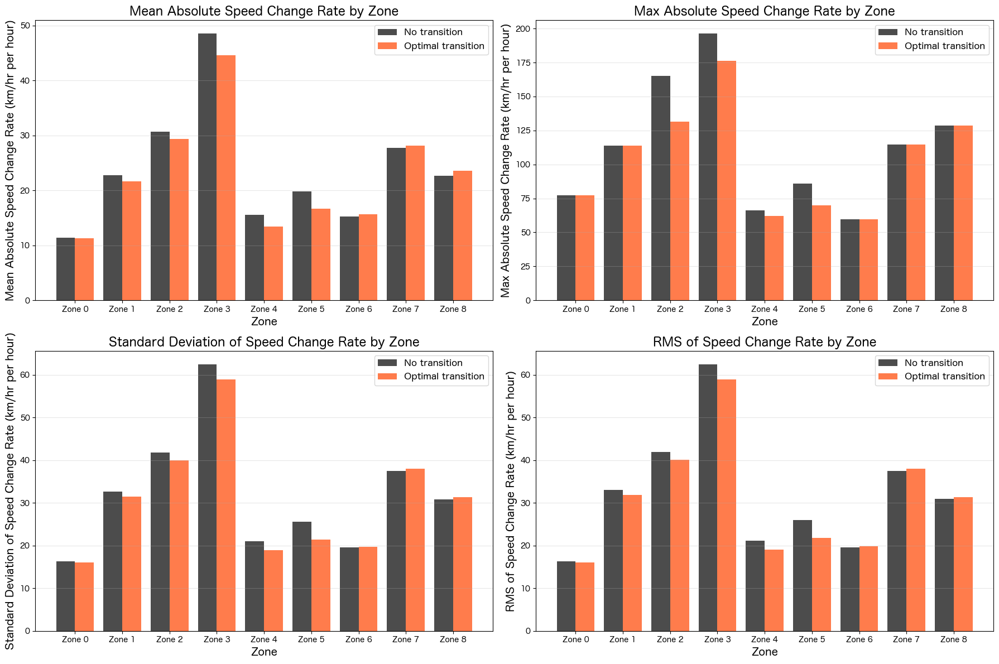

In [20]:
metrics = ['mean_abs_rate', 'max_abs_rate', 'std_rate', 'rms_rate']
metric_names = ['Mean Absolute Speed Change Rate', 'Max Absolute Speed Change Rate', 'Standard Deviation of Speed Change Rate', 'RMS of Speed Change Rate']

# 速度変化率の大きさをバープロットで比較（ゾーンごと）
fig, axes = plt.subplots(2, 2, figsize=(18, 12))
axes = axes.flatten()

for idx, (metric, metric_name) in enumerate(zip(metrics, metric_names)):
    ax = axes[idx]
    
    # データを準備
    x = np.arange(num_zones)
    width = 0.8 / len(cases.keys())
    
    for i, case_name in enumerate(cases.keys()):
        values = []
        for zone_id in range(num_zones):
            if zone_id in speed_rate_stats[case_name]:
                values.append(speed_rate_stats[case_name][zone_id][metric])
            else:
                values.append(0)
        
        offset = (i - len(cases.keys())/2 + 0.5) * width
        ax.bar(x + offset, values, width, label=case_name, 
               color=colors[case_name], alpha=0.7)
    
    ax.set_xlabel('Zone', fontsize=14)
    ax.set_ylabel(f'{metric_name} (km/hr per hour)', fontsize=14)
    ax.set_title(f'{metric_name} by Zone', fontsize=16, fontweight='bold')
    ax.set_xticks(x)
    ax.set_xticklabels([f'Zone {z}' for z in range(num_zones)])
    ax.legend(fontsize=12)
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

/var/folders/z5/_rt5n3qn6vj99nwh4dj6zwhm0000gn/T/ipykernel_95289/1029641607.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(case_names_list, rotation=45, ha='right')
/var/folders/z5/_rt5n3qn6vj99nwh4dj6zwhm0000gn/T/ipykernel_95289/1029641607.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(case_names_list, rotation=45, ha='right')
/var/folders/z5/_rt5n3qn6vj99nwh4dj6zwhm0000gn/T/ipykernel_95289/1029641607.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  ax.set_xticklabels(case_names_list, rotation=45, ha='right')
/var/folders/z5/_rt5n3qn6vj99nwh4dj6zwhm0000gn/T/ipykernel_95289/1029641607.py:34: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_

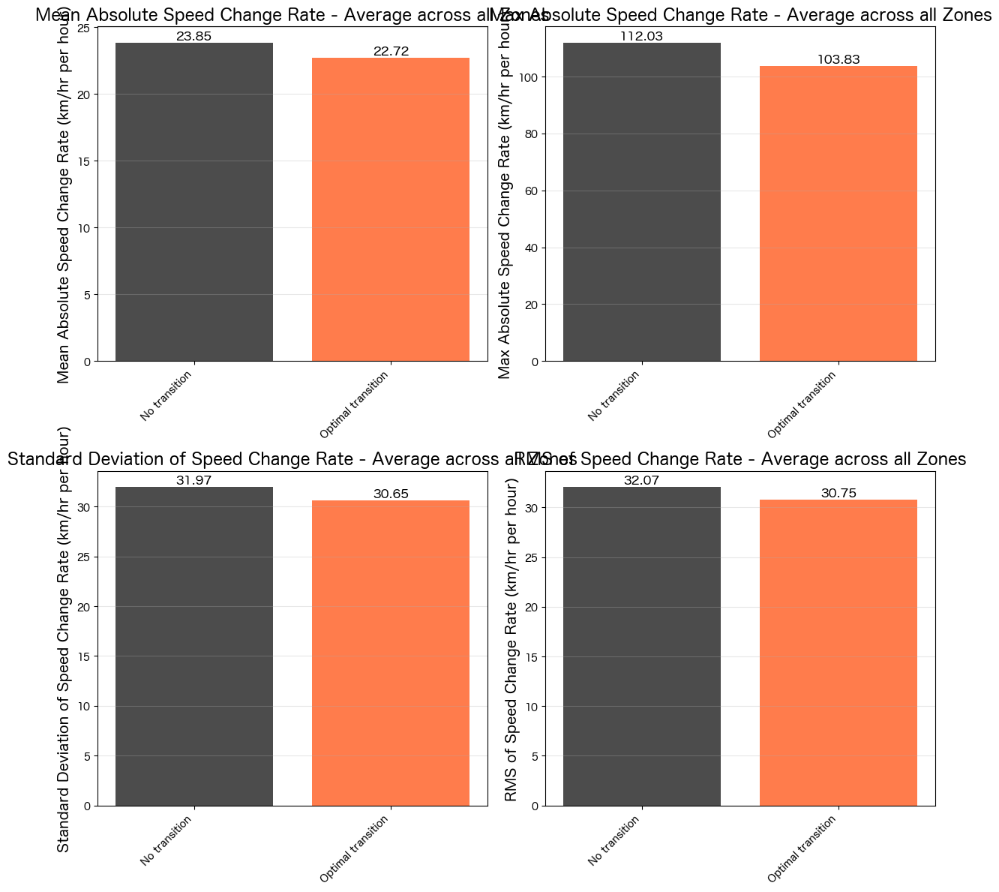

In [21]:
# 速度変化率の大きさをバープロットで比較（ケースごとの全ゾーン平均）
fig, axes = plt.subplots(2, 2, figsize=(12, 12))
axes = axes.flatten()

for idx, (metric, metric_name) in enumerate(zip(metrics, metric_names)):
    ax = axes[idx]
    
    # 各ケースの全ゾーン平均を計算
    case_means = []
    case_names_list = list(cases.keys())
    
    for case_name in case_names_list:
        values = []
        for zone_id in range(num_zones):
            if zone_id in speed_rate_stats[case_name]:
                values.append(speed_rate_stats[case_name][zone_id][metric])
        if len(values) > 0:
            case_means.append(np.mean(values))
        else:
            case_means.append(0)
    
    # バープロット
    bars = ax.bar(case_names_list, case_means, 
                  color=[colors[name] for name in case_names_list], alpha=0.7)
    
    # 値を表示
    for i, (bar, val) in enumerate(zip(bars, case_means)):
        height = bar.get_height()
        ax.text(bar.get_x() + bar.get_width()/2., height,
                f'{val:.2f}', ha='center', va='bottom', fontsize=12)
    
    ax.set_ylabel(f'{metric_name} (km/hr per hour)', fontsize=14)
    ax.set_title(f'{metric_name} - Average across all Zones', fontsize=16, fontweight='bold')
    ax.set_xticklabels(case_names_list, rotation=45, ha='right')
    ax.grid(True, alpha=0.3, axis='y')

plt.tight_layout()
plt.show()

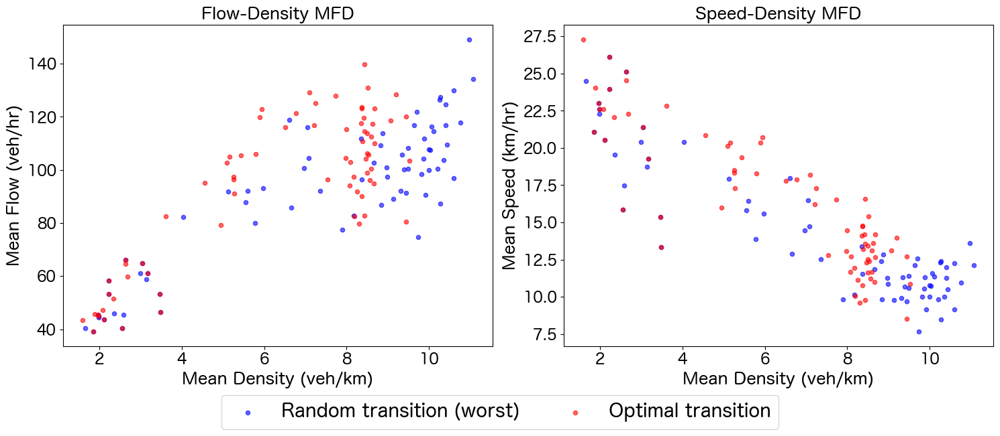


=== 各ケースのMFD統計情報 ===


【Random transition (worst)】
  最大密度: 11.07 veh/km
  最大流量: 149.12 veh/hr
  最大速度: 26.10 km/hr
  平均密度: 7.31 veh/km
  平均流量: 90.48 veh/hr
  平均速度: 14.16 km/hr

【Optimal transition】
  最大密度: 9.52 veh/km
  最大流量: 139.78 veh/hr
  最大速度: 27.29 km/hr
  平均密度: 6.32 veh/km
  平均流量: 93.37 veh/hr
  平均速度: 16.40 km/hr


In [6]:
# 3つのケースのMFDを重ね合わせて可視化
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
matplotlib.rcParams['font.family'] = 'Hiragino Maru Gothic Pro'  # macOSの場合
import numpy as np

normal = 0.8
evac = 1.0
# 3つのケースのMFDファイルパス
mfd_files = {
    
    'Random transition (worst)': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_worst_93_reroute0.3/mfd/MFD_edge.csv',
    'Optimal transition': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_normal_93_reroute0.3/mfd/MFD_edge.csv',
    #'No-transition': f'/Users/masudasatoki/Desktop/MFD_evac/code/sumo/output/{normal}normal_{evac}evac_control_noreconf_93_reroute0.3/mfd/MFD_edge.csv',
}
color_list = {key: value for key, value in zip(mfd_files.keys(), ['blue', 'red', 'grey', ])}
marker_list = {key: value for key, value in zip(mfd_files.keys(), ['o', 'o', 'x',])}

# データを読み込む
mfd_data = {}
for case_name, file_path in mfd_files.items():
    mfd_data[case_name] = pd.read_csv(file_path)

# MFDの可視化（3つの図を並べて表示）
upper = 360 # 可視化する時間の上限（分）
fig, axes = plt.subplots(1, 2, figsize=(15, 6))

# 1. Flow vs Density (q-k図)
ax1 = axes[0]
for case_name, df in mfd_data.items():
    df = df.loc[df['time']<upper]
    ax1.scatter(df['density'], df['flow'], label=case_name, alpha=0.6, s=20, color=color_list[case_name], marker=marker_list[case_name])
ax1.set_xlabel('Mean Density (veh/km)', fontsize=18)
ax1.set_ylabel('Mean Flow (veh/hr)', fontsize=18)
ax1.set_title('Flow-Density MFD', fontsize=18, fontweight='bold')
ax1.tick_params(axis='x', labelsize=16)
ax1.tick_params(axis='y', labelsize=16)
#ax1.grid(True, alpha=0.3)

# 2. Speed vs Density (v-k図)
ax2 = axes[1]
for case_name, df in mfd_data.items():
    df = df.loc[df['time']<upper]
    ax2.scatter(df['density'], df['speed'], label=case_name, alpha=0.6, s=20, color=color_list[case_name], marker=marker_list[case_name])
ax2.set_xlabel('Mean Density (veh/km)', fontsize=18)
ax2.set_ylabel('Mean Speed (km/hr)', fontsize=18)
ax2.set_title('Speed-Density MFD', fontsize=18, fontweight='bold')
ax2.tick_params(axis='x', labelsize=16)
ax2.tick_params(axis='y', labelsize=16)
#ax2.grid(True, alpha=0.3)

"""
# 3. Flow vs Speed (q-v図)
ax3 = axes[2]
for case_name, df in mfd_data.items():
    df = df.loc[df['time']<upper]
    ax3.scatter(df['speed'], df['flow'], label=case_name, alpha=0.6, s=20, color=color_list[case_name])
ax3.set_xlabel('Mean Speed (km/hr)', fontsize=18)
ax3.set_ylabel('Mean Flow (veh/hr)', fontsize=18)
ax3.set_title('Flow-Speed MFD (q-v)', fontsize=18, fontweight='bold')
ax3.legend(fontsize=16)
ax3.grid(True, alpha=0.3)
"""
# 凡例
handles, labels = ax1.get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=20, ncol=len(mfd_files), bbox_to_anchor=(0.5, -0.1))
plt.tight_layout()
plt.savefig('/Users/masudasatoki/Desktop/micro_contraflow_effect.png', dpi=300)
plt.show()

# 統計情報を表示
print("\n=== 各ケースのMFD統計情報 ===\n")
for case_name, df in mfd_data.items():
    df = df.loc[df['time']<upper]
    print(f"\n【{case_name}】")
    print(f"  最大密度: {df['density'].max():.2f} veh/km")
    print(f"  最大流量: {df['flow'].max():.2f} veh/hr")
    print(f"  最大速度: {df['speed'].max():.2f} km/hr")
    print(f"  平均密度: {df['density'].mean():.2f} veh/km")
    print(f"  平均流量: {df['flow'].mean():.2f} veh/hr")
    print(f"  平均速度: {df['speed'].mean():.2f} km/hr")


control groups: 52 / net edges: 12799 / k_hops=3
Zone groups: 17
  zone1=0, zone2=1: 2 groups [0, 1]
  zone1=0, zone2=4: 6 groups [2, 3, 4, 5, 6, 7]
  zone1=0, zone2=7: 3 groups [8, 9, 10]
  zone1=1, zone2=2: 3 groups [11, 12, 13]
  zone1=1, zone2=4: 3 groups [14, 15, 16]
  zone1=1, zone2=6: 2 groups [17, 18]
  zone1=2, zone2=3: 1 groups [19]
  zone1=2, zone2=5: 1 groups [20]
  zone1=2, zone2=6: 3 groups [21, 22, 23]
  zone1=3, zone2=5: 2 groups [24, 25]
  zone1=3, zone2=8: 3 groups [26, 27, 28]
  zone1=4, zone2=6: 5 groups [29, 30, 31, 32, 33]
  zone1=4, zone2=7: 3 groups [34, 35, 36]
  zone1=5, zone2=6: 5 groups [37, 38, 39, 40, 41]
  zone1=5, zone2=8: 3 groups [42, 43, 44]
  zone1=6, zone2=8: 2 groups [45, 46]
  zone1=7, zone2=8: 5 groups [47, 48, 49, 50, 51]


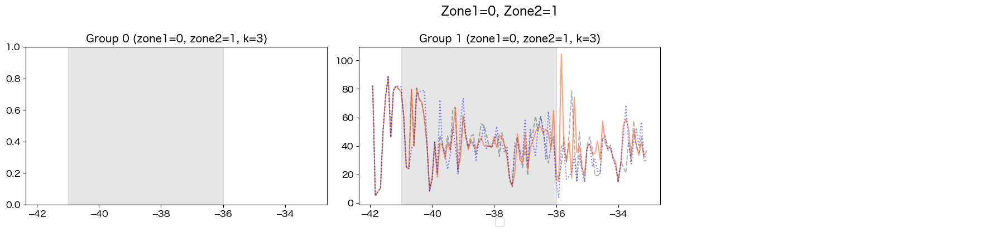

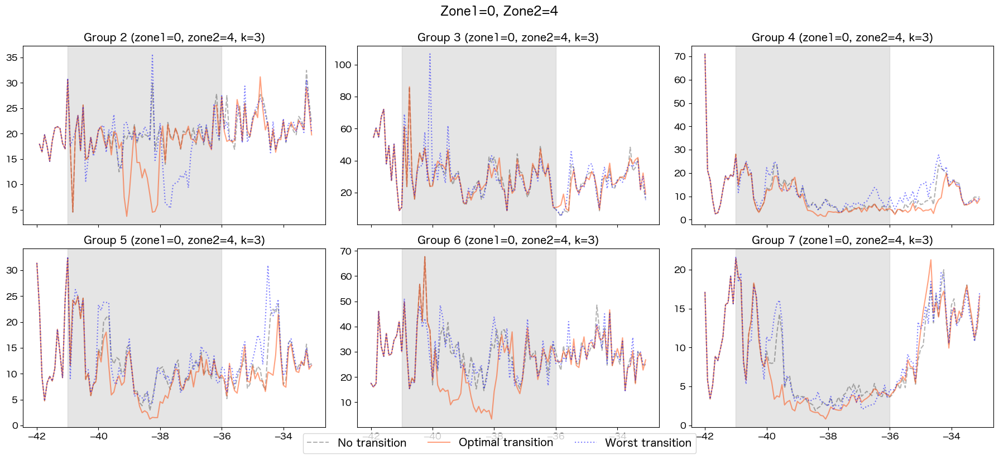

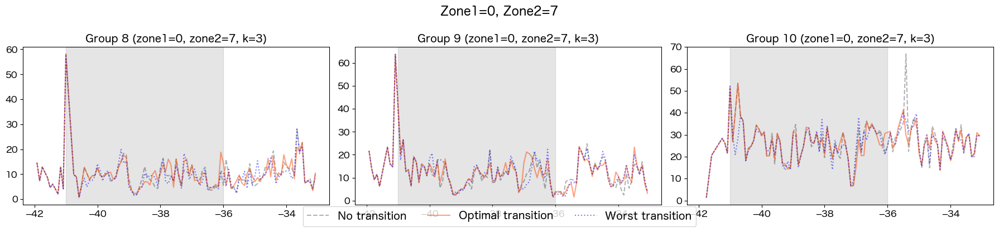

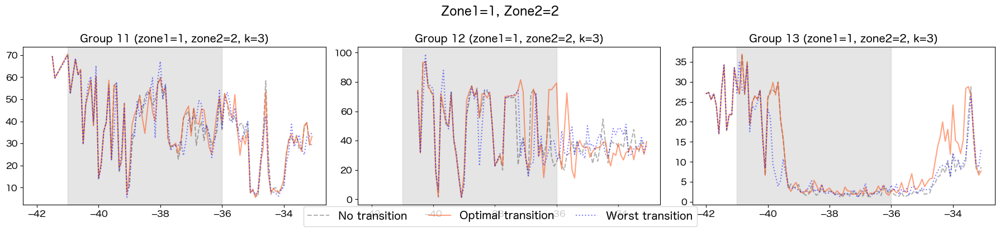

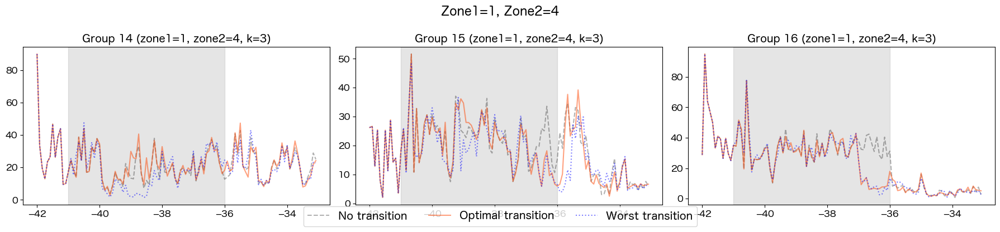

...

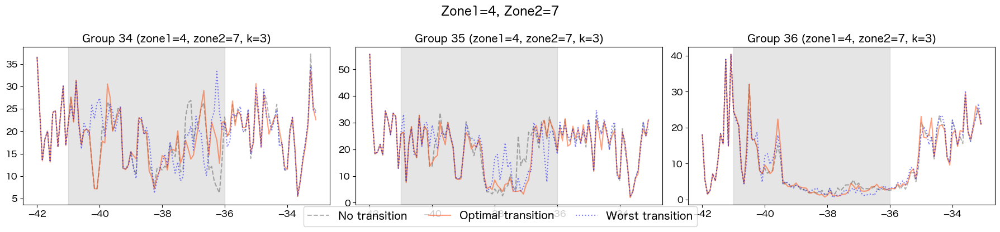

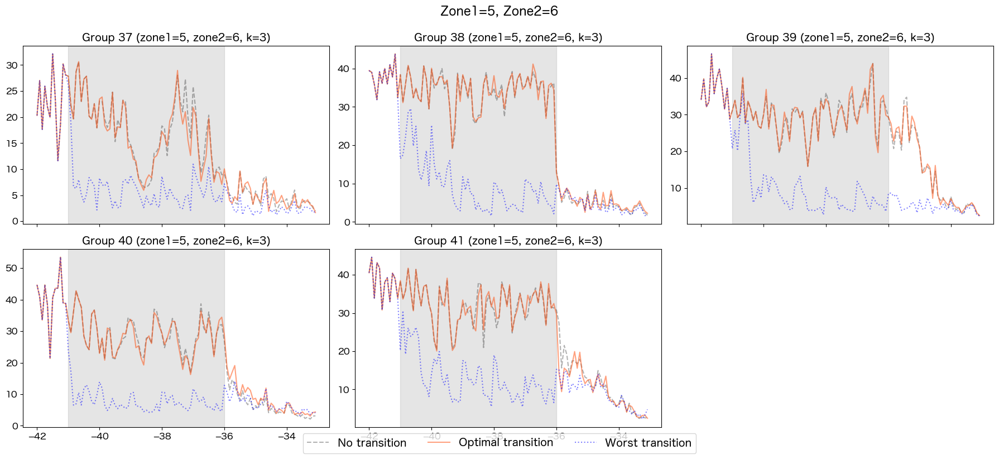

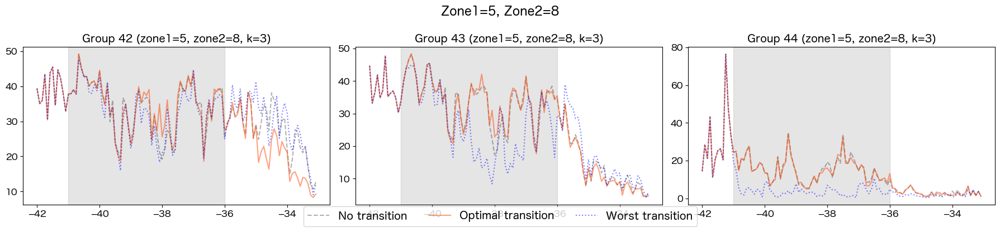

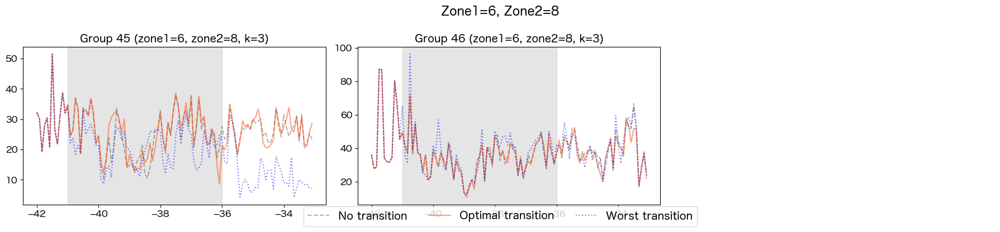

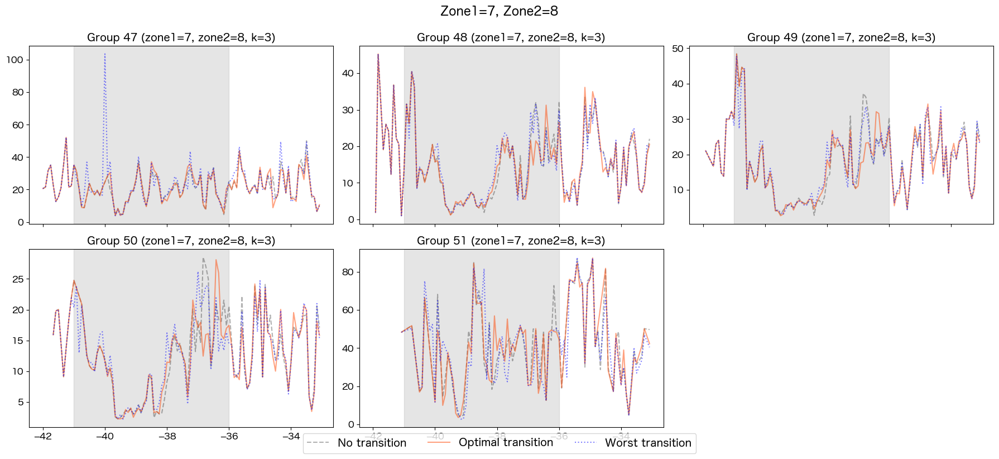

<Figure size 640x480 with 0 Axes>

In [8]:
# 制御リンク周辺（局所）の混雑を見たい場合：contraflow.csv を起点に、近傍リンク上で Edie 指標を集計
# ここでは「制御リンク（edge_pos/edge_neg）から上下流に k-hop のリンク集合」を近傍として定義（k は下で変更可）

import xml.etree.ElementTree as ET
from collections import defaultdict

contraflow_file = '/Users/masudasatoki/Desktop/MFD_evac/code/sumo/network/data/contraflow.csv'

# 使っているネットワークに合わせて選択してください（例：対面通行ネットワーク）
net_file = '/Users/masudasatoki/Desktop/MFD_evac/code/sumo/network/data/output_contraflow.net.xml'

# 近傍の定義（k-hop）
k_hops = 3


def load_edge_graph_from_netxml(net_path: str):
    """SUMO の *.net.xml から、エッジ集合と隣接（from->to）を作る（internal edge は除外）"""
    tree = ET.parse(net_path)
    root = tree.getroot()

    edges = set()
    for edge in root.findall('edge'):
        if edge.get('function') == 'internal':
            continue
        eid = edge.get('id')
        if eid:
            edges.add(eid)

    out_map = defaultdict(set)
    in_map = defaultdict(set)
    for conn in root.findall('connection'):
        fr = conn.get('from')
        to = conn.get('to')
        if fr in edges and to in edges:
            out_map[fr].add(to)
            in_map[to].add(fr)

    return edges, out_map, in_map


def k_hop_neighborhood(seed_edges, out_map, in_map, k: int = 1, direction: str = 'both'):
    """seed_edges から k-hop の近傍エッジ集合（seed 自体は含めない）"""
    visited = set()
    frontier = set(seed_edges)

    for _ in range(k):
        nxt = set()
        for e in frontier:
            if direction in ('both', 'downstream'):
                nxt |= out_map.get(e, set())
            if direction in ('both', 'upstream'):
                nxt |= in_map.get(e, set())
        nxt -= visited
        visited |= nxt
        frontier = nxt

    return visited


# --- 近傍リンク集合を作る ---
control_df = pd.read_csv(contraflow_file)
control_df['edge_pos'] = control_df['edge_pos'].astype(str).str.strip()
control_df['edge_neg'] = control_df['edge_neg'].astype(str).str.strip()

net_edges, out_map, in_map = load_edge_graph_from_netxml(net_file)

# group_id -> 近傍（制御リンク + k-hop）
group_to_edges = {}
for gid, gdf in control_df.groupby('group_id'):
    seeds = set(gdf['edge_pos'].tolist() + gdf['edge_neg'].tolist())
    seeds = {e for e in seeds if e in net_edges}
    neigh = k_hop_neighborhood(seeds, out_map, in_map, k=k_hops, direction='both')
    group_to_edges[int(gid)] = seeds | neigh

# edge_id -> group_id（複数グループに属する可能性があるのでリスト）
edge_to_groups = defaultdict(list)
for gid, edgeset in group_to_edges.items():
    for eid in edgeset:
        edge_to_groups[eid].append(gid)

print(f"control groups: {len(group_to_edges)} / net edges: {len(net_edges)} / k_hops={k_hops}")


# --- 各ケースについて、group_id 単位で局所 MFD 指標（密度・流量・速度）を時系列集計 ---
control_mfd_data = {
    case_name: {gid: {'density': [], 'speed': [], 'flow': [], 'time': []} for gid in group_to_edges.keys()}
    for case_name in cases.keys()
}

for case_name, edge_dir in cases.items():
    edge_files = sorted(glob.glob(f"{edge_dir}/edge_data_*.csv"))

    for edge_file in edge_files:
        time = int(edge_file.split('_')[-1].split('.')[0])
        edge_data = pd.read_csv(edge_file)

        # 前セルと同じ前処理
        edge_data['edge_id'] = edge_data['edge_id'].astype(str).str.strip()
        numeric_cols = ['density', 'speed', 'flow', 'accumulation', 'link_weighted_flow', 'length']
        for col in numeric_cols:
            edge_data[col] = pd.to_numeric(edge_data[col], errors='coerce')

        # グループへの所属を付与（複数所属があり得るので explode）
        # 注意: edge_to_groups に無い場合は NaN、また空リスト [] は explode で NaN になるため、explode 後に dropna する
        edge_data['group_ids'] = edge_data['edge_id'].map(edge_to_groups)
        edge_data['group_ids'] = edge_data['group_ids'].apply(lambda x: x if isinstance(x, list) else [])
        edge_data = edge_data.explode('group_ids')
        edge_data = edge_data.dropna(subset=['group_ids'])
        edge_data['group_id'] = pd.to_numeric(edge_data['group_ids'], errors='coerce')
        edge_data = edge_data.dropna(subset=['group_id'])
        edge_data['group_id'] = edge_data['group_id'].astype(int)

        valid = edge_data[
            (edge_data['length'].notna()) &
            (edge_data['length'] > 0) &
            (edge_data['accumulation'].notna())
        ]

        agg = valid.groupby('group_id', as_index=False).agg(
            net_length=('length', 'sum'),
            num_veh=('accumulation', 'sum'),
            weighted_flow=('link_weighted_flow', 'sum'),
        )

        for _, r in agg.iterrows():
            gid = int(r['group_id'])
            net_length = float(r['net_length'])
            num_veh = float(r['num_veh'])
            weighted_flow = float(r['weighted_flow'])

            if net_length > 0:
                density = num_veh / net_length
                flow = weighted_flow / net_length
            else:
                density = 0
                flow = 0

            speed = (weighted_flow / num_veh) if num_veh > 0 else 0

            control_mfd_data[case_name][gid]['density'].append(density)
            control_mfd_data[case_name][gid]['speed'].append(speed)
            control_mfd_data[case_name][gid]['flow'].append(flow)
            control_mfd_data[case_name][gid]['time'].append(time)


# --- zone1, zone2 ごとにグループ化して描画 ---
# control_df から各 group_id の zone1, zone2 を取得（group_id ごとに最初の値を取得）
group_to_zone = {}
for gid, gdf in control_df.groupby('group_id'):
    # 各 group_id の zone1, zone2 の値を取得（通常は同じ値のはず）
    zone1_vals = gdf['zone1'].unique()
    zone2_vals = gdf['zone2'].unique()
    group_to_zone[int(gid)] = {
        'zone1': int(zone1_vals[0]) if len(zone1_vals) > 0 else -1,
        'zone2': int(zone2_vals[0]) if len(zone2_vals) > 0 else -1
    }

# zone1, zone2 の組み合わせごとに group_id をグループ化
zone_groups = {}
for gid, zones in group_to_zone.items():
    z1, z2 = zones['zone1'], zones['zone2']
    key = (z1, z2)
    if key not in zone_groups:
        zone_groups[key] = []
    zone_groups[key].append(gid)

# 各 zone の group_id をソート（表示順を統一）
for key in zone_groups:
    zone_groups[key] = sorted(zone_groups[key])

print(f"Zone groups: {len(zone_groups)}")
for (z1, z2), gids in sorted(zone_groups.items()):
    print(f"  zone1={z1}, zone2={z2}: {len(gids)} groups {gids}")

# 各 zone ごとに描画
for (z1, z2), group_ids in sorted(zone_groups.items()):
    n_groups = len(group_ids)
    if n_groups == 0:
        continue
    
    # 列は3固定、行数は自動決定
    ncols = 3
    nrows = int(np.ceil(n_groups / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 4 * nrows), sharex=True, sharey=False)
    axes = np.array(axes).reshape(-1)
    
    for idx, gid in enumerate(group_ids):
        ax = axes[idx]
        
        for case_name in cases.keys():
            d = control_mfd_data[case_name][gid]
            if len(d['time']) == 0:
                continue
            
            time_hours = np.array(d['time']) / 3600.0 + 6 - 48
            speeds = np.array(d['speed'])
            order = np.argsort(time_hours)
            
            ax.plot(
                time_hours[order], speeds[order],
                label=case_name,
                alpha=alphas.get(case_name, 0.7) if 'alphas' in globals() else 0.7,
                linewidth=1.5,
                linestyle=line_styles.get(case_name, '-') if 'line_styles' in globals() else '-',
                color=colors.get(case_name, None) if 'colors' in globals() else None,
            )
        
        ax.axvspan(7 - 48, 12 - 48, color='gray', alpha=0.2)
        ax.set_title(f'Group {gid} (zone1={z1}, zone2={z2}, k={k_hops})', fontsize=14, fontweight='bold')
        ax.tick_params(axis='both', labelsize=12)
    
    # 使わないサブプロットを非表示
    for ax in axes[n_groups:]:
        ax.axis('off')
    
    handles, labels = axes[0].get_legend_handles_labels()
    fig.legend(handles, labels, loc='lower center', fontsize=14, ncol=len(cases), bbox_to_anchor=(0.5, -0.02))
    fig.suptitle(f'Zone1={z1}, Zone2={z2}', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()

handles, labels = axes[0].get_legend_handles_labels()
fig.legend(handles, labels, loc='lower center', fontsize=16, ncol=len(cases), bbox_to_anchor=(0.5, -0.05))
plt.tight_layout()
plt.show()


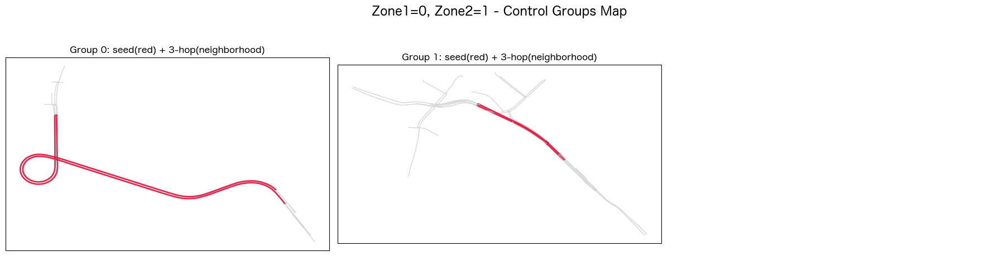

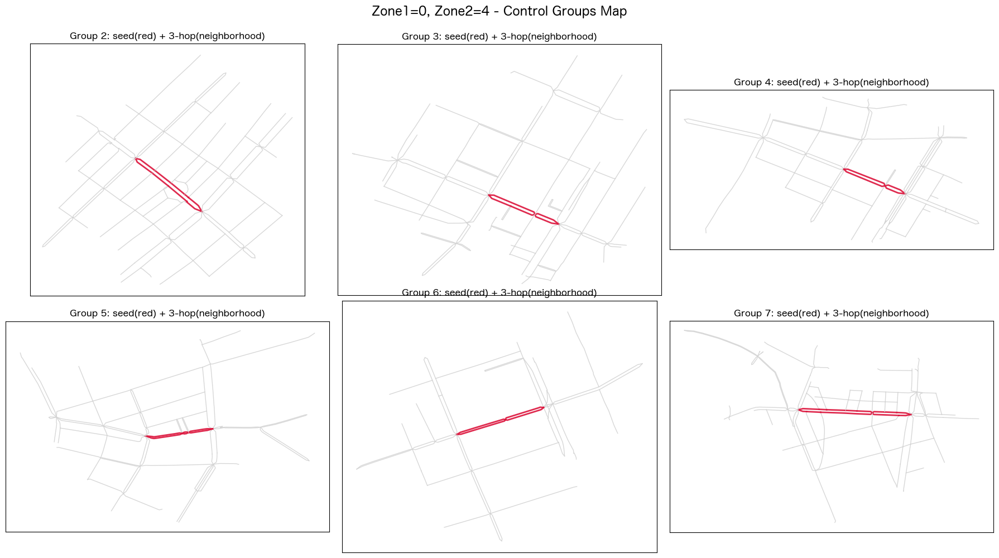

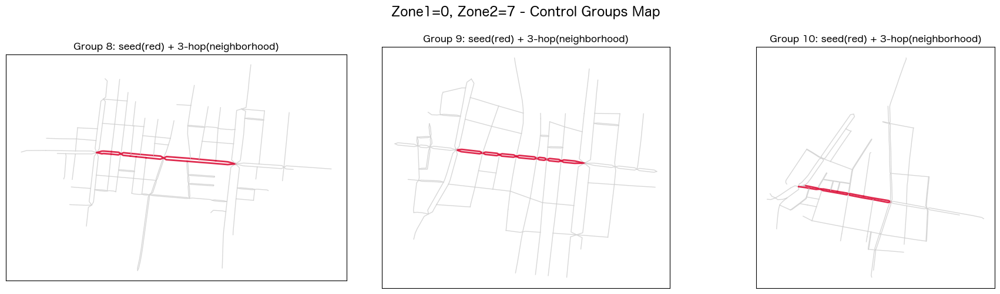

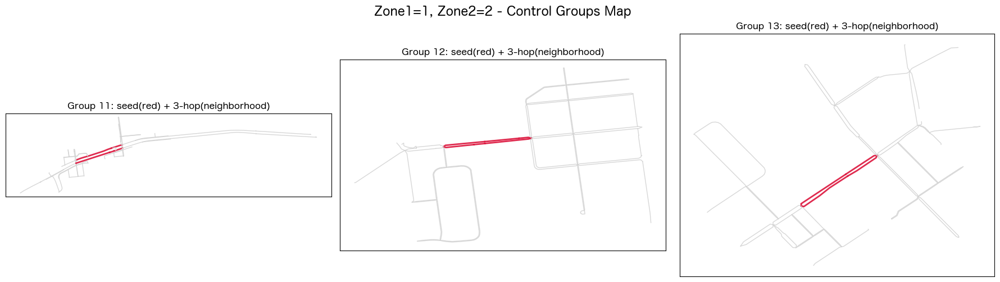

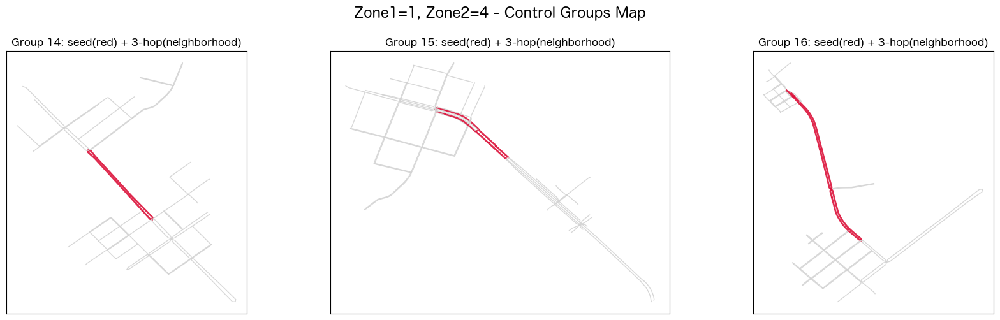

...

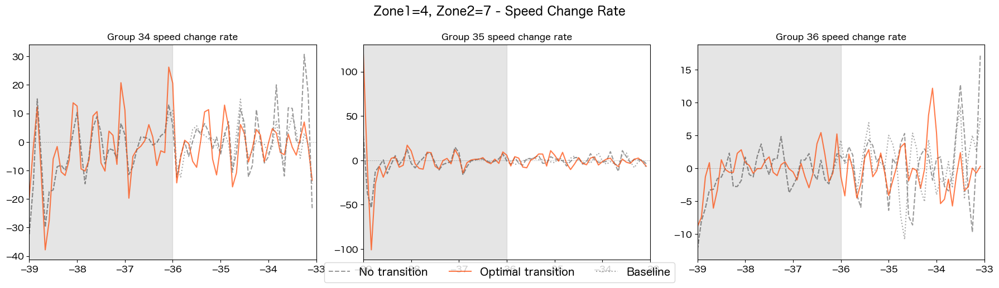

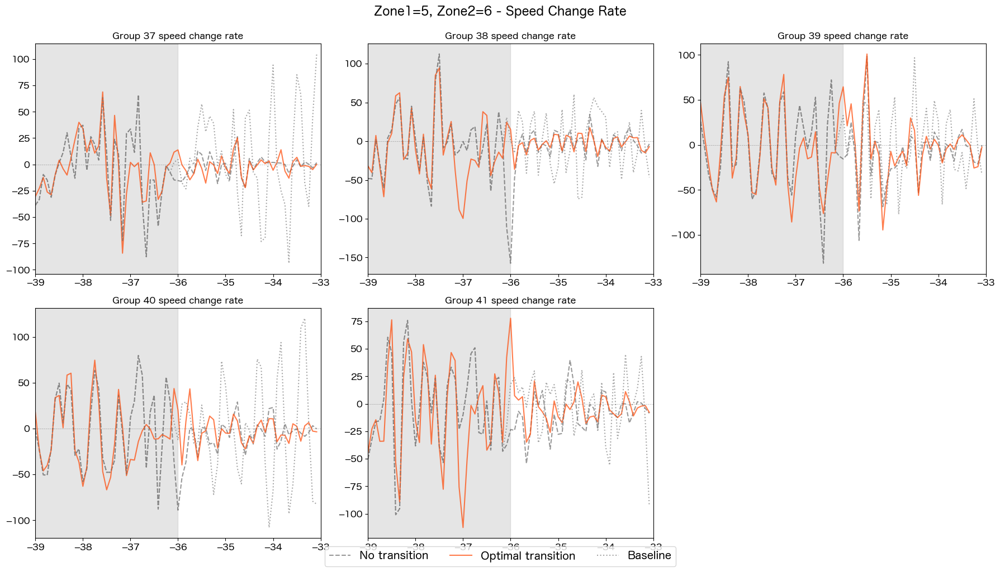

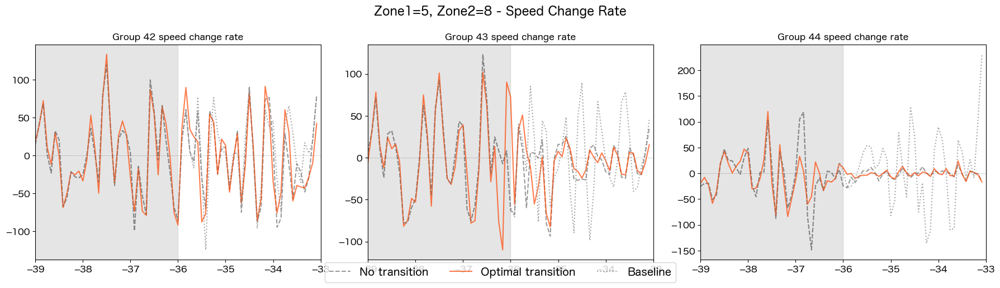

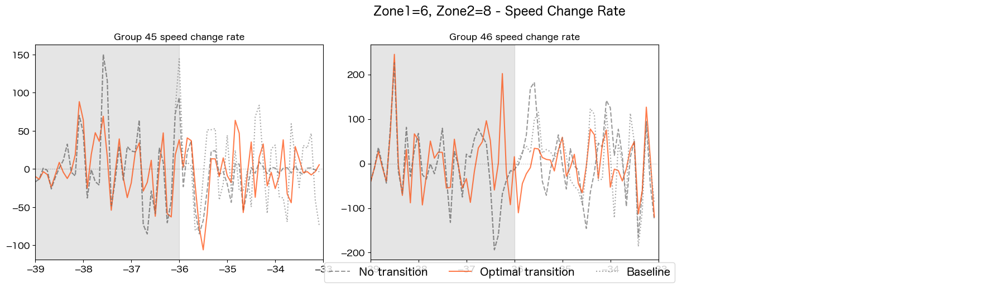

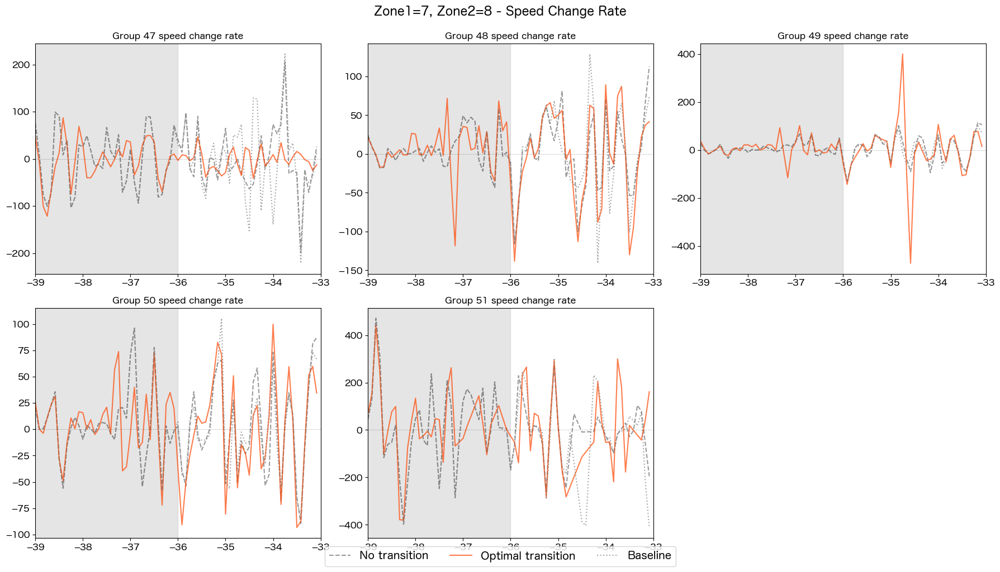

In [22]:
# output.geojson を使って、制御 group（seed + k-hop 近傍）を地図上に描画
# 依存: 直前のセルで作った group_to_edges / control_df（seed 判定用）/ TOP_GROUPS（任意）

import json
import numpy as np
import matplotlib.pyplot as plt

geojson_file = '/Users/masudasatoki/Desktop/MFD_evac/code/sumo/network/data/output.geojson'

with open(geojson_file, 'r') as f:
    gj = json.load(f)

# edge_id -> LineString coordinates
edge_geom = {}
for feat in gj.get('features', []):
    prop = feat.get('properties', {})
    if prop.get('element') != 'edge':
        continue
    eid = str(prop.get('id')).strip()
    geom = feat.get('geometry', {})
    if geom.get('type') != 'LineString':
        continue
    coords = geom.get('coordinates', [])
    if eid and coords:
        edge_geom[eid] = coords

# group_id -> seed edges（制御リンク自体）
seed_by_group = {
    int(gid): set(gdf['edge_pos'].astype(str).str.strip().tolist() + gdf['edge_neg'].astype(str).str.strip().tolist())
    for gid, gdf in control_df.groupby('group_id')
}

# zone1, zone2 ごとにグループ化（直前のセルと同じロジック）
group_to_zone = {}
for gid, gdf in control_df.groupby('group_id'):
    zone1_vals = gdf['zone1'].unique()
    zone2_vals = gdf['zone2'].unique()
    group_to_zone[int(gid)] = {
        'zone1': int(zone1_vals[0]) if len(zone1_vals) > 0 else -1,
        'zone2': int(zone2_vals[0]) if len(zone2_vals) > 0 else -1
    }

zone_groups = {}
for gid, zones in group_to_zone.items():
    z1, z2 = zones['zone1'], zones['zone2']
    key = (z1, z2)
    if key not in zone_groups:
        zone_groups[key] = []
    zone_groups[key].append(gid)

for key in zone_groups:
    zone_groups[key] = sorted(zone_groups[key])

# 各 zone ごとに地図を描画
for (z1, z2), group_ids in sorted(zone_groups.items()):
    n_groups = len(group_ids)
    if n_groups == 0:
        continue
    
    ncols = 3
    nrows = int(np.ceil(n_groups / ncols))
    fig, axes = plt.subplots(nrows, ncols, figsize=(18, 5 * nrows))
    axes = np.array(axes).reshape(-1)
    
    for i, gid in enumerate(group_ids):
        ax = axes[i]
        edgeset = group_to_edges[int(gid)]
        seeds = seed_by_group.get(int(gid), set())
        
        # 近傍（seed以外）を薄灰、seed を赤
        for eid in edgeset:
            coords = edge_geom.get(str(eid))
            if coords is None:
                continue
            xs = [c[0] for c in coords]
            ys = [c[1] for c in coords]
            if eid in seeds:
                ax.plot(xs, ys, color='crimson', linewidth=2.0, alpha=0.9)
            else:
                ax.plot(xs, ys, color='lightgray', linewidth=1.0, alpha=0.9)
        
        ax.set_title(f'Group {gid}: seed(red) + {k_hops}-hop(neighborhood)', fontsize=12, fontweight='bold')
        ax.set_aspect('equal', adjustable='box')
        ax.set_xticks([])
        ax.set_yticks([])
    
    for ax in axes[n_groups:]:
        ax.axis('off')
    
    fig.suptitle(f'Zone1={z1}, Zone2={z2} - Control Groups Map', fontsize=16, fontweight='bold', y=0.995)
    plt.tight_layout()
    plt.show()


# 参考：制御 group の「速度変化率」もゾーンと同様に描く（必要なら）
# ※ control_mfd_data が直前のセルで作られている前提
if 'control_mfd_data' in globals():
    # 各 zone ごとに速度変化率を描画
    for (z1, z2), group_ids in sorted(zone_groups.items()):
        n_groups = len(group_ids)
        if n_groups == 0:
            continue
        
        ncols = 3
        nrows = int(np.ceil(n_groups / ncols))
        fig, axes = plt.subplots(nrows, ncols, figsize=(18, 5 * nrows))
        axes = np.array(axes).reshape(-1)
        
        # 時間範囲（ゾーンの図と揃えるならここを合わせる）
        time_min = -39
        time_max = -33
        
        for i, gid in enumerate(group_ids):
            ax = axes[i]
            for case_name in cases.keys():
                d = control_mfd_data[case_name][int(gid)]
                if len(d['time']) < 2:
                    continue
                
                time_hours = np.array(d['time']) / 3600.0 + 6 - 48
                speeds = np.array(d['speed'])
                order = np.argsort(time_hours)
                t = time_hours[order]
                v = speeds[order]
                
                mask = (t >= time_min) & (t <= time_max)
                t = t[mask]
                v = v[mask]
                if len(t) < 2:
                    continue
                
                dvdt = np.gradient(v, t)  # km/hr per hour
                ax.plot(
                    t, dvdt,
                    label=case_name,
                    alpha=alphas.get(case_name, 0.7) if 'alphas' in globals() else 0.7,
                    linewidth=1.5,
                    linestyle=line_styles.get(case_name, '-') if 'line_styles' in globals() else '-',
                    color=colors.get(case_name, None) if 'colors' in globals() else None,
                )
            
            ax.axvspan(7 - 48, 12 - 48, color='gray', alpha=0.2)
            ax.axhline(y=0, color='black', linestyle='--', linewidth=0.5, alpha=0.3)
            ax.set_xlim(time_min, time_max)
            ax.set_title(f'Group {gid} speed change rate', fontsize=12, fontweight='bold')
            ax.tick_params(axis='both', labelsize=12)
        
        for ax in axes[n_groups:]:
            ax.axis('off')
        
        handles, labels = axes[0].get_legend_handles_labels()
        fig.legend(handles, labels, loc='lower center', fontsize=14, ncol=len(cases), bbox_to_anchor=(0.5, -0.02))
        fig.suptitle(f'Zone1={z1}, Zone2={z2} - Speed Change Rate', fontsize=16, fontweight='bold', y=0.995)
        plt.tight_layout()
        plt.show()
